# Training Custom ResNet
___

## Table of contents
1. [Imports](#Imports)
2. [LoadData](#LoadData)
3. [Config](#Configs)
4. [Analysis](#Analysis)
5. [Process](#Process)

## Imports

In [27]:
import os
import numpy as np
import pandas as pd

import optuna
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import Dataset,DataLoader,random_split
from torch.utils.tensorboard import SummaryWriter
import torchvision
from torchvision import models, transforms
from torch_lr_finder import LRFinder

from tqdm.notebook import tqdm

import math
import pretrainedmodels as ptm
import h5py
import copy
from datetime import datetime
import matplotlib.pyplot as plt

In [2]:
from Library.datasets import DatasetH5TwoRandom, DatasetH5ForTest, compute_std_mean
from Library.transforms import RandomFlip,RandomOffset,RandomRotateGrayscale
from Library.scheduler import OneCycleLR,LogLR
from Library.cresnet import initialize_cresnet
from Library.dml import RefBasedDeepMetric
from Library.models.FeatureExtractor import FeatureExtractor, Block, CustomNet
from Library.trainers import RefBasedDeepMetricTrainer

In [3]:
from Library.util import (
    jupyter_wide_screen,
    strings_contain_words, 
    strings_contain_patterns, 
    add_unique_entry
)

jupyter_wide_screen()

## LoadData

#### To initialize dataset: obtain References and Dataset object

In [4]:
def init_dataset(data_path, fnames):

    mean_val = 124.8660 # 6 Seq mean_val
    std_val = 67.9694   # 6 Seq std_val
    ds_h5 = []
    refs_list = []
    
    ### 可能还需要用 transforms.RandomHorizontalFlip()
    #img_transforms = [transforms.ToTensor(),transforms.Normalize((mean_val,),(std_val,))] # 先标准化处理
    img_transforms = [RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    comb = os.path.join(data_path, fnames)
    # to obtain the 6 Seq data
    for i in range(6):
        h5_fpath = comb.format(i)
        h5_f = DatasetH5TwoRandom(h5_fpath,transform = composed_img_transforms)
        
        # obtain the references, the first 10 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

In [5]:
data_path = "../data/22008_1000202026_652510007"
fnames = "roi_versuch2_1_{}_720x20.h5"
refs_list, ds_h5 = init_dataset(data_path,fnames)

#### Dataloader for training set ,validation set, test set (60%,20%,20%)

In [6]:
batch_sizes = [32, 32, 32]
shuffle_flags = [True, False, False]
ds_ratio = [0.6, 0.2, 0.2]

def init_dataloaders(datasets,ds_ratio):
    dataloaders = []
    
    for ds in datasets:
        splitted_ds_num_data = [round(len(ds) * ds_ratio[i]) for i in range(len(ds_ratio))]
        splitted_ds_num_data[0] += len(ds) - int(np.sum(splitted_ds_num_data))

        splitted_ds = []

        for tmp_ds, batch_size, shuffle in zip(random_split(ds, splitted_ds_num_data), batch_sizes, shuffle_flags):

            splitted_ds.append(
                DataLoader(
                    tmp_ds,
                    batch_size=batch_size,
                    shuffle=shuffle,
                    drop_last=True,
                )
            )

        dataloaders.append(splitted_ds)
    return dataloaders

In [7]:
dataloaders = init_dataloaders(ds_h5, ds_ratio)

train_dls = [dls[0] for dls in dataloaders]
valid_dls = [dls[1] for dls in dataloaders]
test_dls = [dls[2] for dls in dataloaders]

## FeatureExtractor

In [8]:
class FeatureExtractor(nn.Module):
    # Custom feature extraction model from pretrained ResNet50

    def __init__(self, model,zero_init_residual=False):
        super(FeatureExtractor, self).__init__()
        
        self.conv1= nn.Conv2d(1, 64, 3, 2, 1)
        self.bn1 = model.bn1
        self.relu = nn.LeakyReLU(0.1)
        #self.relu = model.relu
        self.maxpool = model.maxpool

        self.layer1 = model.layer1
        self.layer2 = model.layer2

        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Sequential(nn.Linear(512, 64))
                
        # weights initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight, mode = 'fan_in', nonlinearity = 'leaky_relu')

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def forward(self, x):

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        self.featuremap0 = x.detach() # 核心代码

        x = self.layer1(x)
        self.featuremap1 = x.detach() # 核心代码
        
        x = self.layer2(x)
        self.featuremap2 = x.detach() # 核心代码
        
        x = self.avgpool(x)
        x = x.reshape(x.shape[0], -1)

        x = self.fc(x)
        self.featuremapfc = x.detach() # 核心代码
        
        # 使用的时候 : feature_output1 = model.featuremap1.transpose(1,0).cpu()
        
        return x
    
    def show_intermediate_shape(self, x):
        x = self.conv1(x)
        print("After conv1: ", x.shape)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        print("After maxpool: ", x.shape)
        x = self.layer1(x)
        print("After layer1: ", x.shape)
        x = self.layer2(x)
        print("After layer2,before avgpool: ", x.shape)
        
        x = self.avgpool(x)
        print("After avgpool,before reshape: ", x.shape)
        x = x.reshape(x.shape[0], -1)
        print("After reshape: ", x.shape)
        x = self.fc(x)
        print("In FC: ", x.shape)

## SiameseNet structure

In [9]:
class SiameseNet(nn.Module):
    def __init__(self, model):
        super(SiameseNet, self).__init__()
        self.model = model
        
    def _calculate_loss(self, v1, v2, refs_vectors):
        r"""Calculate distance between vector of img1&img2 and each reference images

        Args:
            v1 (Tensor, torch.Size[batchsize,128]): batch of img1s from feature extractor
            v2 (Tensor, torch.Size[batchsize,128]): batch of img2s from feature extractor
            refs_vectors(List of Tensor, torch.Size([1,128])): List of 10 refs vectors
        """
        v_dim = v1.size(1)
        num_ref = len(refs_vectors)

        # concatenate the refs tensor
        for i,vec in enumerate(refs_vectors):
            if i == 0:
                refs_tensor = vec
            else:
                refs_tensor = torch.cat((refs_tensor,vec),dim = 0)


        v11 = v1.unsqueeze(1).repeat(1, num_ref, 1)
        v22 = v2.unsqueeze(1).repeat(1, num_ref, 1)
        refs = refs_tensor.unsqueeze(0).repeat(v1.size(0), 1, 1)  #v1.size(0) = batch size

        kernel_matrix1 = (v11-refs).pow(2).sum(2) #torch.Size([batchsize, 10])
        kernel_matrix2 = (v22-refs).pow(2).sum(2) #torch.Size([batchsize, 10])

        v1_distance_mean = torch.mean(kernel_matrix1,dim = 1) #torch.Size([batchsize])
        v2_distance_mean = torch.mean(kernel_matrix2,dim = 1) #torch.Size([batchsize])
        
        diff = v1_distance_mean - v2_distance_mean
        
        #print("Before Sigmoid outputs",outputs)
        sigmoid = nn.Sigmoid()
        outputs = sigmoid(diff)
        #print("After Sigmoid outputs",outputs)

        return outputs

    def forward(self, x1, x2, refs):
        v1 = self.model(x1)
        v2 = self.model(x2)
        feature_refs = [self.model(ref) for ref in refs]
        
        outputs = self._calculate_loss(v1, v2, feature_refs)
        return outputs
    
    # This function used to plot the degradation metric , x1 is the sequential image
    def forward_test(self, x1, refs):
        v1 = self.model(x1)
        feature_refs = [self.model(ref) for ref in refs]
        
        return v1, feature_refs
    
    def get_model(self, x):
        return self.model(x)


#### Load pretrained ResNet

In [10]:
res_model = models.resnet50(pretrained=True)
feature_extractor = FeatureExtractor(res_model)
model = RefBasedDeepMetric(feature_extractor,loss_non_linearity_name='sigmoid',criterion_name='bce',)
#model = SiameseNet(feature_extractor)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

RefBasedDeepMetric(
  (feature_extractor): FeatureExtractor(
    (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): LeakyReLU(negative_slope=0.1)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downs

In [13]:
x = torch.randn(32,1,720,20)
model.feature_extractor.show_intermediate_shape(x.to(device))

After conv1:  torch.Size([32, 64, 360, 10])
After maxpool:  torch.Size([32, 64, 180, 5])
After layer1:  torch.Size([32, 256, 180, 5])
After layer2,before avgpool:  torch.Size([32, 512, 90, 3])
After avgpool,before reshape:  torch.Size([32, 512, 1, 1])
After reshape:  torch.Size([32, 512])
In FC:  torch.Size([32, 64])


# Define the degradation metrics function

In [ ]:
def degradation_metrics(v1, refs_vectors):
    r"""Calculate distance between vector of img1&img2 and each reference images
    Args:
        v1 (Tensor, torch.Size[batchsize,128]): batch of imgs from feature extractor
        
        refs_vectors(List of Tensor, torch.Size([1,128])): List of 10 refs vectors
    """
    v_dim = v1.size(1) # 128
    num_ref = len(refs_vectors)
    
    # concatenate the refs tensor
    for i,vec in enumerate(refs_vectors):
        if i == 0:
            refs_tensor = vec
        else:
            refs_tensor = torch.cat((refs_tensor,vec),dim = 0)

    v11 = v1.unsqueeze(1).repeat(1, num_ref, 1)
    refs = refs_tensor.unsqueeze(0).repeat(v1.size(0), 1, 1)  #v1.size(0) = batch size
    
    kernel_matrix1 = (v11-refs).pow(2).sum(2) 
    
    metric = torch.mean(kernel_matrix1,dim = 1) 

    return metric

## Learning Rate Test

In [14]:
from torch.optim.lr_scheduler import _LRScheduler
from torch_lr_finder import LRFinder ,TrainDataLoaderIter, ValDataLoaderIter

In [15]:
class CustomTrainIter(TrainDataLoaderIter):
    def inputs_labels_from_batch(self, batch_data):
        img1, img2, labels = batch_data
        return img1, img2, labels
    
    def __next__(self):
        try:
            batch = next(self._iterator)
            img1, img2, labels = self.inputs_labels_from_batch(batch)
        except StopIteration:
            if not self.auto_reset:
                raise
            self._iterator = iter(self.data_loader)
            batch = next(self._iterator)
            img1, img2, labels = self.inputs_labels_from_batch(batch)

        return img1, img2, labels

In [16]:
class CustomValIter(ValDataLoaderIter):
    def inputs_labels_from_batch(self, batch_data):
        img1, img2, labels = batch_data
        return img1, img2, labels

In [17]:
class LinearLR(_LRScheduler):
    """Linearly increases the learning rate between two boundaries over a number of
    iterations.

    Arguments:
        optimizer (torch.optim.Optimizer): wrapped optimizer.
        end_lr (float): the final learning rate.
        num_iter (int): the number of iterations over which the test occurs.
        last_epoch (int, optional): the index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr

        if num_iter <= 1:
            raise ValueError("`num_iter` must be larger than 1")
        self.num_iter = num_iter

        super(LinearLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        r = self.last_epoch / (self.num_iter - 1)

        return [base_lr + r * (self.end_lr - base_lr) for base_lr in self.base_lrs]

In [18]:
class ExponentialLR(_LRScheduler):
    """Exponentially increases the learning rate between two boundaries over a number of
    iterations.

    Arguments:
        optimizer (torch.optim.Optimizer): wrapped optimizer.
        end_lr (float): the final learning rate.
        num_iter (int): the number of iterations over which the test occurs.
        last_epoch (int, optional): the index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr

        if num_iter <= 1:
            raise ValueError("`num_iter` must be larger than 1")
        self.num_iter = num_iter

        super(ExponentialLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        # In earlier Pytorch versions last_epoch starts at -1, while in recent versions
        # it starts at 0. We need to adjust the math a bit to handle this. See
        # discussion at: https://github.com/davidtvs/pytorch-lr-finder/pull/42
        
        r = self.last_epoch / (self.num_iter - 1)

        return [base_lr * (self.end_lr / base_lr) ** r for base_lr in self.base_lrs]

In [19]:
try:
    from apex import amp

    IS_AMP_AVAILABLE = True
except ImportError:
    IS_AMP_AVAILABLE = False
    
class CustomLRFinder(LRFinder):
    
    def custom_range_test(
        self,
        train_loader,
        curr_refs,
        val_loader=None,
        start_lr=None,
        end_lr=10,
        num_iter=100,
        step_mode="exp",
        smooth_f=0.05,
        diverge_th=5,
        accumulation_steps=1,
        non_blocking_transfer=True,
    ):
       
        # Reset test results
        self.history = {"lr": [], "loss": []}
        self.best_loss = None

        # Move the model to the proper device
        self.model.to(self.device)

        # Check if the optimizer is already attached to a scheduler
        self._check_for_scheduler()

        # Set the starting learning rate
        if start_lr:
            self._set_learning_rate(start_lr)

        # Initialize the proper learning rate policy
        if step_mode.lower() == "exp":
            lr_schedule = ExponentialLR(self.optimizer, end_lr, num_iter)
        elif step_mode.lower() == "linear":
            lr_schedule = LinearLR(self.optimizer, end_lr, num_iter)
        else:
            raise ValueError("expected one of (exp, linear), got {}".format(step_mode))

        if smooth_f < 0 or smooth_f >= 1:
            raise ValueError("smooth_f is outside the range [0, 1[")

        # Create an iterator to get data batch by batch
        if isinstance(train_loader, DataLoader):
            train_iter = TrainDataLoaderIter(train_loader)
        elif isinstance(train_loader, TrainDataLoaderIter):
            train_iter = train_loader
        else:
            raise ValueError(
                "`train_loader` has unsupported type: {}."
                "Expected types are `torch.utils.data.DataLoader`"
                "or child of `TrainDataLoaderIter`.".format(type(train_loader))
            )

        if val_loader:
            if isinstance(val_loader, DataLoader):
                val_iter = CustomValIter(val_loader)
            elif isinstance(val_loader, ValDataLoaderIter):
                val_iter = val_loader
            else:
                raise ValueError(
                    "`val_loader` has unsupported type: {}."
                    "Expected types are `torch.utils.data.DataLoader`"
                    "or child of `ValDataLoaderIter`.".format(type(val_loader))
                )

        for iteration in tqdm(range(num_iter)):
            # Train on batch and retrieve loss
            loss = self._train_batch(
                train_iter,
                curr_refs,
                accumulation_steps,
                non_blocking_transfer= non_blocking_transfer,
            )
            if val_loader:
                loss = self._validate(
                    val_iter, curr_refs, non_blocking_transfer=non_blocking_transfer
                )

            # Update the learning rate
            self.history["lr"].append(lr_schedule.get_lr()[0])
            lr_schedule.step()

            # Track the best loss and smooth it if smooth_f is specified
            if iteration == 0:
                self.best_loss = loss
            else:
                if smooth_f > 0:
                    loss = smooth_f * loss + (1 - smooth_f) * self.history["loss"][-1]
                if loss < self.best_loss:
                    self.best_loss = loss

            # Check if the loss has diverged; if it has, stop the test
            self.history["loss"].append(loss)
            if loss > diverge_th * self.best_loss:
                print("Stopping early, the loss has diverged")
                break

        print("Learning rate search finished. See the graph with {finder_name}.plot()")

    def _train_batch(self, train_iter, curr_refs, accumulation_steps, non_blocking_transfer=True):
        self.model.train()
        total_loss = None  # for late initialization
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.optimizer.zero_grad()
        curr_refs = curr_refs.float().to(device)

        for i in range(accumulation_steps):
            img1, img2, labels = next(train_iter)
            labels = labels.view(-1)
            labels = labels.to(device)
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)

            # Forward pass
            loss, preds = self.model.compute_loss(img1, img2, curr_refs, labels)

            # Loss should be averaged in each step
            loss /= accumulation_steps

            # Backward pass
            if IS_AMP_AVAILABLE and hasattr(self.optimizer, "_amp_stash"):
                # For minor performance optimization, see also:
                # https://nvidia.github.io/apex/advanced.html#gradient-accumulation-across-iterations
                delay_unscale = ((i + 1) % accumulation_steps) != 0

                with amp.scale_loss(
                    loss, self.optimizer, delay_unscale=delay_unscale
                ) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if total_loss is None:
                total_loss = loss
            else:
                total_loss += loss

        self.optimizer.step()

        return total_loss.item()
    
    def _validate(self, val_iter, curr_refs, non_blocking_transfer=True):
        # Set model to evaluation mode and disable gradient computation
        running_loss = 0
        self.model.eval()
        
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        curr_refs = curr_refs.float().to(device)
        with torch.no_grad():
            for img1, img2, labels in val_iter:
                # Move data to the correct device
                labels = labels.view(-1)
                labels = labels.to(device)
                img1 = img1.float().to(device)
                img2 = img2.float().to(device)

                # Forward pass and loss computation
                loss, preds = self.model.compute_loss(img1, img2, curr_refs, labels)
                running_loss += loss.item() * len(labels)

        return running_loss / len(val_iter.dataset)
    

### LR Test Config

In [20]:
start_lr = 1e-8
end_lr = 1e-1

min_lr_factor   = 0.2
anneal_lr_factor= 1e-1

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2
refs_dl_idx = 0

optimizer = torch.optim.Adam(model.parameters(),lr=start_lr, eps=1e-08, weight_decay=0)
#optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=lr, momentum=0.5)
#criterion = nn.CrossEntropyLoss()
#criterion = nn.BCEWithLogitsLoss(reduction = 'none')
criterion = nn.BCELoss()


Learning rate search finished. See the graph with {finder_name}.plot()


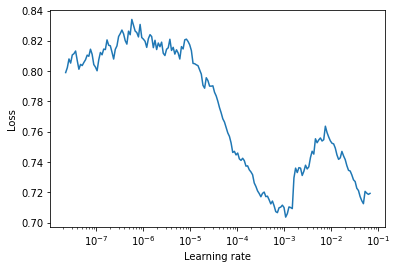

In [22]:
#lr_finder.reset()
lr_finder = CustomLRFinder(model, optimizer, criterion, device="cuda")

# seq dataloader / shuffel the dataloader
for refs, train_dl, val_dl in zip (refs_list, train_dls, valid_dls):
    custom_train_iter = CustomTrainIter(train_dl)
    custom_val_iter = CustomValIter(val_dl)
lr_finder.custom_range_test(custom_train_iter, curr_refs = refs, end_lr=end_lr, num_iter=200)
lr_finder.plot(suggest_lr= False)
lr_finder.reset()

## To see the intmediate feature

In [ ]:
feature_output1 = model.model.featuremap1.transpose(1,0).cpu()
feature_output2 = model.model.featuremap2.transpose(1,0).cpu()
#feature_output3 = model.model.featuremap3.transpose(1,0).cpu()
#feature_output4 = model.model.featuremap4.transpose(1,0).cpu()
#feature_output_fc = model.model.featuremapfc.transpose(1,0).cpu()
feature_output2.shape

In [ ]:
def feature_imshow(inp, title=None):
    
    """Imshow for Tensor."""
    
    inp = inp.detach().numpy().transpose((1, 2, 0))
    
    mean = np.array([0.5, 0.5, 0.5])
    
    std = np.array([0.5, 0.5, 0.5])
    
    inp = std * inp + mean
    
    inp = np.clip(inp, 0, 1)
    
    plt.imshow(inp)
    
    if title is not None:
        plt.title(title)
    
    plt.pause(0.001)  # pause a bit so that plots are updated

In [ ]:
out = torchvision.utils.make_grid(feature_output2)
feature_imshow(out)


## Training Config

In [23]:
num_epochs = 50

lr = 4e-4

min_lr_factor = 0.1
phases_ratio = [0.3, 0.2, 0.3, 0.2]

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2

run_train = True

#optimizer = torch.optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=lr, momentum=0.5)

criterion = nn.BCELoss()
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

Total Train Iterations:  580
Total Train Iterations List:  [37, 82, 209, 291, 476, 580]
Valid iterations per seq:  [12, 15, 42, 28, 61, 35]


Train



Sequence:1, Seq Training Mean Loss: 0.7137482343493281, Seq Training Acc: 0.5287162162162162
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.661701516310374, Seq Training Acc: 0.5861111111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.7012311468912861, Seq Training Acc: 0.5206692913385826
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6995486057386165, Seq Training Acc: 0.5221036585365854
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6757800617733517, Seq Training Acc: 0.5763513513513514
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.6347902359870764, Seq Training Acc: 0.6358173076923077
******************************************************************
Epoch:1, Epoch Training Loss Mean: 0.6786932349205017, Epoch Training Acc: 0.5648706896551724
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.8282379905382792, Seq Valid Acc: 0.4791666666666667



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.7447907408078511, Seq Valid Acc: 0.5854166666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7627136224792117, Seq Valid Acc: 0.5200892857142857



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.8052026970045907, Seq Valid Acc: 0.5178571428571429



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.8135433148165219, Seq Valid Acc: 0.5712090163934426



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.6010481136185782, Seq Valid Acc: 0.6964285714285714
Epoch:1, Epoch Valid Mean Loss: 0.7583068013191223, Epoch Valid Acc: 0.5704339378238342
******************************************************************


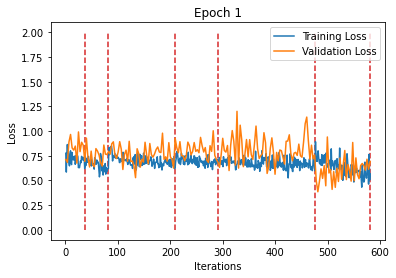

Train



Sequence:1, Seq Training Mean Loss: 0.7004675720189069, Seq Training Acc: 0.5447635135135135
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5860590318838755, Seq Training Acc: 0.6694444444444444
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6961923382413668, Seq Training Acc: 0.546751968503937
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6975900458126534, Seq Training Acc: 0.5240091463414634
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6680858434857548, Seq Training Acc: 0.5903716216216216
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.5843138474111373, Seq Training Acc: 0.6887019230769231
******************************************************************
Epoch:2, Epoch Training Loss Mean: 0.6590919494628906, Epoch Training Acc: 0.5922952586206897
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 1.0006580005089443, Seq Valid Acc: 0.4895833333333333



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.7166885336240133, Seq Valid Acc: 0.5958333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.819154082309632, Seq Valid Acc: 0.5059523809523809



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.7944228308541434, Seq Valid Acc: 0.5145089285714286



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.895794072112099, Seq Valid Acc: 0.5625



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.539607355424336, Seq Valid Acc: 0.7491071428571429
Epoch:2, Epoch Valid Mean Loss: 0.7924157381057739, Epoch Valid Acc: 0.5751295336787565
******************************************************************


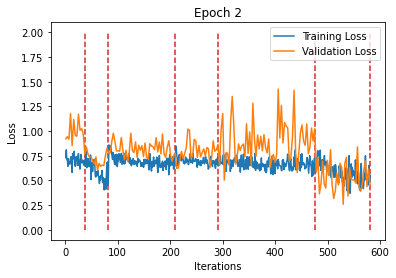

Train



Sequence:1, Seq Training Mean Loss: 0.6969588205621049, Seq Training Acc: 0.5608108108108109
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5726373195648193, Seq Training Acc: 0.7006944444444444
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6811452578371904, Seq Training Acc: 0.5688976377952756
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6708428845172976, Seq Training Acc: 0.5819359756097561
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6570182958164731, Seq Training Acc: 0.6160472972972973
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.5515088126636468, Seq Training Acc: 0.7355769230769231
******************************************************************
Epoch:3, Epoch Training Loss Mean: 0.6413379311561584, Epoch Training Acc: 0.6253771551724138
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.8007089694341024, Seq Valid Acc: 0.4661458333333333



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.7112303495407104, Seq Valid Acc: 0.5708333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7573516766230265, Seq Valid Acc: 0.5044642857142857



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.7126652640955788, Seq Valid Acc: 0.5345982142857143



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6757380776718015, Seq Valid Acc: 0.5835040983606558



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.5106415893350329, Seq Valid Acc: 0.7625
Epoch:3, Epoch Valid Mean Loss: 0.6794447898864746, Epoch Valid Acc: 0.5833873056994818
******************************************************************


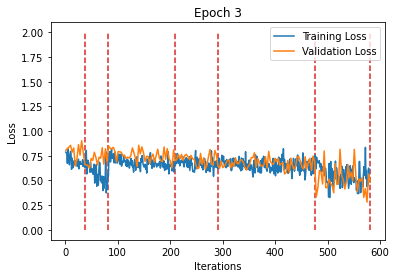

Train



Sequence:1, Seq Training Mean Loss: 0.6961959310480066, Seq Training Acc: 0.5388513513513513
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.5612508065170712, Seq Training Acc: 0.70625
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6826742680992667, Seq Training Acc: 0.5733267716535433
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6547908106955086, Seq Training Acc: 0.6112804878048781
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6512658194915668, Seq Training Acc: 0.6217905405405405
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.5318422950804234, Seq Training Acc: 0.7373798076923077
******************************************************************
Epoch:4, Epoch Training Loss Mean: 0.633109986782074, Epoch Training Acc: 0.6316810344827586
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7643946607907613, Seq Valid Acc: 0.4817708333333333



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6046282768249511, Seq Valid Acc: 0.68125



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7562231549194881, Seq Valid Acc: 0.48735119047619047



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.7008178021226611, Seq Valid Acc: 0.5368303571428571



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6954498476669436, Seq Valid Acc: 0.5706967213114754



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.4856375753879547, Seq Valid Acc: 0.7571428571428571
Epoch:4, Epoch Valid Mean Loss: 0.6686331033706665, Epoch Valid Acc: 0.584520725388601
******************************************************************


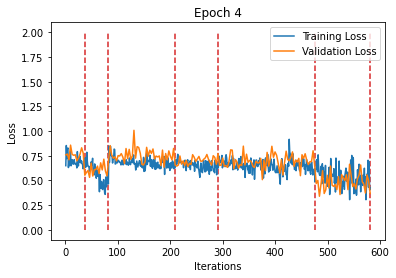

Train



Sequence:1, Seq Training Mean Loss: 0.6921818127503266, Seq Training Acc: 0.5523648648648649
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4863543430964152, Seq Training Acc: 0.7847222222222222
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6675980701221256, Seq Training Acc: 0.593011811023622
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6605162453360673, Seq Training Acc: 0.6108993902439024
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6373246460347562, Seq Training Acc: 0.6371621621621621
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.5097412876784801, Seq Training Acc: 0.7629206730769231
******************************************************************
Epoch:5, Epoch Training Loss Mean: 0.6161416172981262, Epoch Training Acc: 0.6523706896551724
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7586490412553152, Seq Valid Acc: 0.4479166666666667



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5844006816546122, Seq Valid Acc: 0.7



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7362549489452725, Seq Valid Acc: 0.4962797619047619



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6887549012899399, Seq Valid Acc: 0.5546875



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6777169284273367, Seq Valid Acc: 0.5804303278688525



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.5070816908563887, Seq Valid Acc: 0.7589285714285714
Epoch:5, Epoch Valid Mean Loss: 0.6588923931121826, Epoch Valid Acc: 0.5918069948186528
******************************************************************


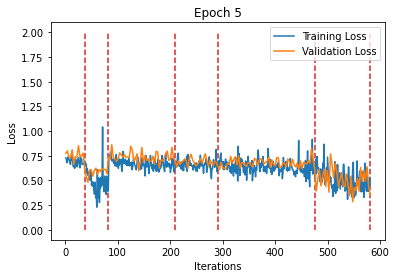

Train



Sequence:1, Seq Training Mean Loss: 0.6994863361925692, Seq Training Acc: 0.5244932432432432
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.488088356786304, Seq Training Acc: 0.7736111111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6674489186504694, Seq Training Acc: 0.5912893700787402
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6471177172370073, Seq Training Acc: 0.6280487804878049
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6296426769849416, Seq Training Acc: 0.6429054054054054
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.4939213836422333, Seq Training Acc: 0.7743389423076923
******************************************************************
Epoch:6, Epoch Training Loss Mean: 0.6095282435417175, Epoch Training Acc: 0.6556573275862069
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7341237366199493, Seq Valid Acc: 0.4635416666666667



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6059532523155212, Seq Valid Acc: 0.7125



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7229543016070411, Seq Valid Acc: 0.49702380952380953



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6886587738990784, Seq Valid Acc: 0.5558035714285714



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6780657817105777, Seq Valid Acc: 0.5835040983606558



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.44391815066337587, Seq Valid Acc: 0.8017857142857143
Epoch:6, Epoch Valid Mean Loss: 0.6447899341583252, Epoch Valid Acc: 0.6028173575129534
******************************************************************


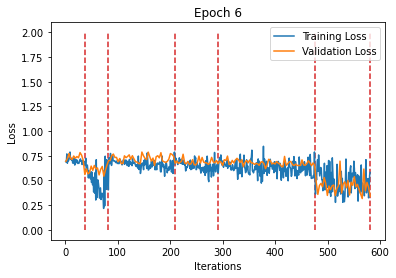

Train



Sequence:1, Seq Training Mean Loss: 0.6839129344837086, Seq Training Acc: 0.5633445945945946
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4303756465514501, Seq Training Acc: 0.8027777777777778
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.677979285792103, Seq Training Acc: 0.5826771653543307
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6429264778044166, Seq Training Acc: 0.6368140243902439
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6252285720528783, Seq Training Acc: 0.6484797297297298
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.44635178034122175, Seq Training Acc: 0.78515625
******************************************************************
Epoch:7, Epoch Training Loss Mean: 0.5958325862884521, Epoch Training Acc: 0.6634698275862069
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7376267611980438, Seq Valid Acc: 0.4947916666666667



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5658600012461344, Seq Valid Acc: 0.7520833333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7370311717192332, Seq Valid Acc: 0.5029761904761905



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6963300236633846, Seq Valid Acc: 0.5602678571428571



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6911689541378959, Seq Valid Acc: 0.5630122950819673



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.3953192813055856, Seq Valid Acc: 0.8223214285714285
Epoch:7, Epoch Valid Mean Loss: 0.641396164894104, Epoch Valid Acc: 0.6070272020725389
******************************************************************


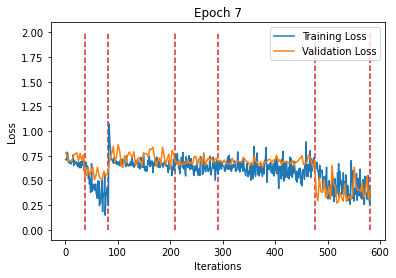

Train



Sequence:1, Seq Training Mean Loss: 0.6803422521900486, Seq Training Acc: 0.5675675675675675
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4397497057914734, Seq Training Acc: 0.7895833333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6692096351638553, Seq Training Acc: 0.6001476377952756
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.6103887478025948, Seq Training Acc: 0.6733993902439024
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6250788380970826, Seq Training Acc: 0.6554054054054054
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.4294316546561626, Seq Training Acc: 0.80078125
******************************************************************
Epoch:8, Epoch Training Loss Mean: 0.5867299437522888, Epoch Training Acc: 0.6767241379310345
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7139469881852468, Seq Valid Acc: 0.4583333333333333



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5414709130922953, Seq Valid Acc: 0.7520833333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7504275895300365, Seq Valid Acc: 0.5096726190476191



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6985456602913993, Seq Valid Acc: 0.5825892857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6779409441791597, Seq Valid Acc: 0.5809426229508197



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.429359347479684, Seq Valid Acc: 0.825
Epoch:8, Epoch Valid Mean Loss: 0.643257200717926, Epoch Valid Acc: 0.6156088082901554
******************************************************************


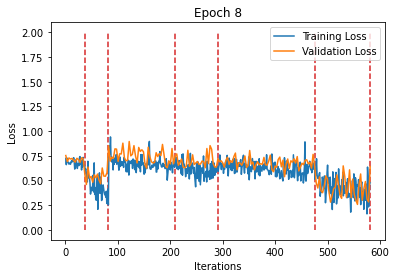

Train



Sequence:1, Seq Training Mean Loss: 0.6815433502197266, Seq Training Acc: 0.5717905405405406
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4446705917517344, Seq Training Acc: 0.79375
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6345050578980934, Seq Training Acc: 0.6392716535433071
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5891073197126389, Seq Training Acc: 0.6909298780487805
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.6149595740679148, Seq Training Acc: 0.6658783783783784
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.4330331266212922, Seq Training Acc: 0.796875
******************************************************************
Epoch:9, Epoch Training Loss Mean: 0.5739986300468445, Epoch Training Acc: 0.6910021551724138
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7085030525922775, Seq Valid Acc: 0.4921875



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5798936327298482, Seq Valid Acc: 0.7416666666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.71531043166206, Seq Valid Acc: 0.5014880952380952



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6978666952678135, Seq Valid Acc: 0.5323660714285714



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6696384744565995, Seq Valid Acc: 0.6168032786885246



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.42445365105356486, Seq Valid Acc: 0.8089285714285714
Epoch:9, Epoch Valid Mean Loss: 0.6346506476402283, Epoch Valid Acc: 0.6162564766839378
******************************************************************


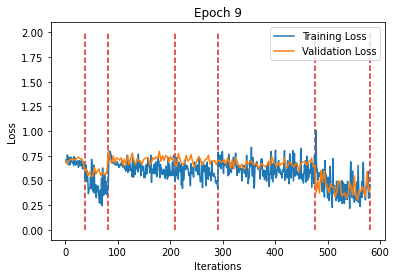

Train



Sequence:1, Seq Training Mean Loss: 0.6715470665210003, Seq Training Acc: 0.5869932432432432
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4089781661828359, Seq Training Acc: 0.825
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.630112196282139, Seq Training Acc: 0.6461614173228346
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5496126791326011, Seq Training Acc: 0.711890243902439
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.5936040962064588, Seq Training Acc: 0.6961148648648648
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.4129614503337787, Seq Training Acc: 0.8058894230769231
******************************************************************
Epoch:10, Epoch Training Loss Mean: 0.55363529920578, Epoch Training Acc: 0.7101293103448276
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7137213299671809, Seq Valid Acc: 0.4895833333333333



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6742416024208069, Seq Valid Acc: 0.6



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7125565225169772, Seq Valid Acc: 0.4650297619047619



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.683659628033638, Seq Valid Acc: 0.5524553571428571



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6865589902049205, Seq Valid Acc: 0.5594262295081968



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.5524108733449663, Seq Valid Acc: 0.7482142857142857
Epoch:10, Epoch Valid Mean Loss: 0.6682000160217285, Epoch Valid Acc: 0.570919689119171
******************************************************************


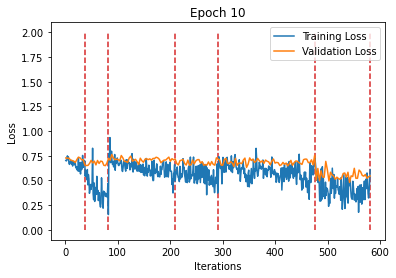

Train



Sequence:1, Seq Training Mean Loss: 0.6843779811988006, Seq Training Acc: 0.5565878378378378
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.42127837704287635, Seq Training Acc: 0.8145833333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.6349984623315766, Seq Training Acc: 0.6476377952755905
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5598291820142327, Seq Training Acc: 0.7107469512195121
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.5904253036589235, Seq Training Acc: 0.6886824324324324
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.4068065884594734, Seq Training Acc: 0.80859375
******************************************************************
Epoch:11, Epoch Training Loss Mean: 0.555804967880249, Epoch Training Acc: 0.7056573275862069
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6870539635419846, Seq Valid Acc: 0.5494791666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6290673971176147, Seq Valid Acc: 0.6645833333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7120431704180581, Seq Valid Acc: 0.47842261904761907



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6819510417325156, Seq Valid Acc: 0.5848214285714286



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6744437383823707, Seq Valid Acc: 0.5942622950819673



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.39877765348979405, Seq Valid Acc: 0.8410714285714286
Epoch:11, Epoch Valid Mean Loss: 0.6309812664985657, Epoch Valid Acc: 0.6151230569948186
******************************************************************


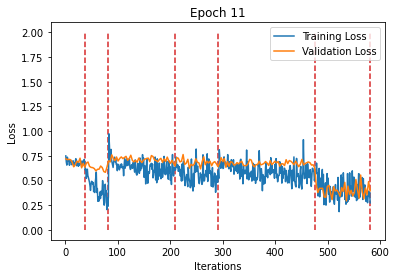

Train



Sequence:1, Seq Training Mean Loss: 0.6649805081857217, Seq Training Acc: 0.625
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.39656704233752355, Seq Training Acc: 0.8291666666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5894266151067779, Seq Training Acc: 0.6820866141732284
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5354594813614357, Seq Training Acc: 0.7282774390243902
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.5546294014196138, Seq Training Acc: 0.7216216216216216
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.3894903990798272, Seq Training Acc: 0.8278245192307693
******************************************************************
Epoch:12, Epoch Training Loss Mean: 0.5247036218643188, Epoch Training Acc: 0.7351293103448275
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.72354523340861, Seq Valid Acc: 0.4557291666666667



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6150789618492126, Seq Valid Acc: 0.6875



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7367037350223178, Seq Valid Acc: 0.46279761904761907



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6927316124950137, Seq Valid Acc: 0.5870535714285714



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.669535837212547, Seq Valid Acc: 0.5993852459016393



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.35174129009246824, Seq Valid Acc: 0.85625
Epoch:12, Epoch Valid Mean Loss: 0.629012405872345, Epoch Valid Acc: 0.6123704663212435
******************************************************************


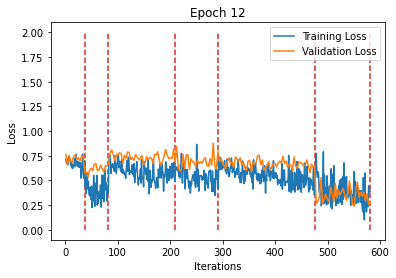

Train



Sequence:1, Seq Training Mean Loss: 0.6599785492226884, Seq Training Acc: 0.6173986486486487
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.41749065981970895, Seq Training Acc: 0.8041666666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5749593900413964, Seq Training Acc: 0.6973425196850394
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5376006084971312, Seq Training Acc: 0.7229420731707317
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.5290698963242608, Seq Training Acc: 0.7442567567567567
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.3844844329242523, Seq Training Acc: 0.8260216346153846
******************************************************************
Epoch:13, Epoch Training Loss Mean: 0.5140926241874695, Epoch Training Acc: 0.7421875
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6747901539007822, Seq Valid Acc: 0.5833333333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6276111642519633, Seq Valid Acc: 0.6708333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7419594370183491, Seq Valid Acc: 0.4635416666666667



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6904607308762414, Seq Valid Acc: 0.5825892857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6660997037027703, Seq Valid Acc: 0.5978483606557377



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.44936992866652353, Seq Valid Acc: 0.8053571428571429
Epoch:13, Epoch Valid Mean Loss: 0.64438796043396, Epoch Valid Acc: 0.6088082901554405
******************************************************************


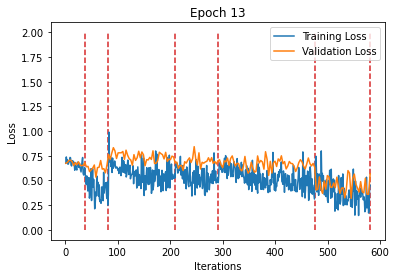

Train



Sequence:1, Seq Training Mean Loss: 0.6244251011191188, Seq Training Acc: 0.6478040540540541
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4083443459537294, Seq Training Acc: 0.8243055555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5681145700413411, Seq Training Acc: 0.6983267716535433
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5222193675070275, Seq Training Acc: 0.7389481707317073
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.4906154803327612, Seq Training Acc: 0.768581081081081
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.374993118385856, Seq Training Acc: 0.8269230769230769
******************************************************************
Epoch:14, Epoch Training Loss Mean: 0.49347397685050964, Epoch Training Acc: 0.7560883620689656
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6982570638259252, Seq Valid Acc: 0.5234375



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6492160161336263, Seq Valid Acc: 0.6166666666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7555614269915081, Seq Valid Acc: 0.42485119047619047



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6906642637082508, Seq Valid Acc: 0.59375



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.7098354716769985, Seq Valid Acc: 0.5686475409836066



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.38551461441176277, Seq Valid Acc: 0.8160714285714286
Epoch:14, Epoch Valid Mean Loss: 0.6527589559555054, Epoch Valid Acc: 0.5867875647668394
******************************************************************


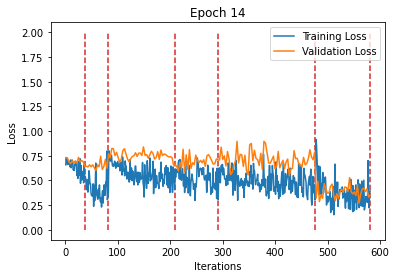

Train



Sequence:1, Seq Training Mean Loss: 0.5457312271401689, Seq Training Acc: 0.7212837837837838
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.37356435259183246, Seq Training Acc: 0.8375
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5789274141544433, Seq Training Acc: 0.6943897637795275
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.508513975070744, Seq Training Acc: 0.7427591463414634
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.4719852702037708, Seq Training Acc: 0.7797297297297298
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.3709077767741222, Seq Training Acc: 0.8287259615384616
******************************************************************
Epoch:15, Epoch Training Loss Mean: 0.47951045632362366, Epoch Training Acc: 0.7653556034482759
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7449014981587728, Seq Valid Acc: 0.4375



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5720765391985575, Seq Valid Acc: 0.7229166666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7438912122022538, Seq Valid Acc: 0.48214285714285715



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6533745186669486, Seq Valid Acc: 0.6450892857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6451633680062215, Seq Valid Acc: 0.6290983606557377



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.6886480467660087, Seq Valid Acc: 0.65
Epoch:15, Epoch Valid Mean Loss: 0.6762462854385376, Epoch Valid Acc: 0.5986075129533679
******************************************************************


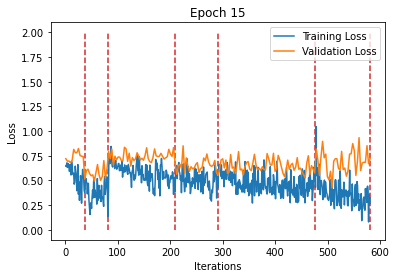

Train



Sequence:1, Seq Training Mean Loss: 0.579420916937493, Seq Training Acc: 0.6858108108108109
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4000135964817471, Seq Training Acc: 0.8263888888888888
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5413840579704976, Seq Training Acc: 0.718257874015748
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.5006455224825115, Seq Training Acc: 0.7477134146341463
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.4511450189190942, Seq Training Acc: 0.7900337837837837
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.3539038905157493, Seq Training Acc: 0.8419471153846154
******************************************************************
Epoch:16, Epoch Training Loss Mean: 0.46468228101730347, Epoch Training Acc: 0.7738146551724138
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6904100626707077, Seq Valid Acc: 0.5625



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6339775721232096, Seq Valid Acc: 0.65625



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7756796578566233, Seq Valid Acc: 0.4568452380952381



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6973013707569667, Seq Valid Acc: 0.5848214285714286



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.7728809401637218, Seq Valid Acc: 0.5573770491803278



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.4014858135155269, Seq Valid Acc: 0.8285714285714286
Epoch:16, Epoch Valid Mean Loss: 0.6792502999305725, Epoch Valid Acc: 0.5966645077720207
******************************************************************


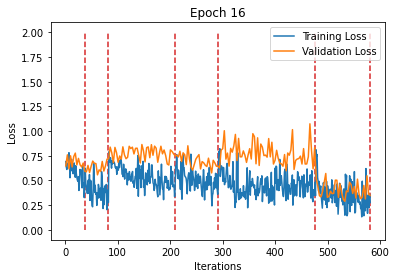

Train



Sequence:1, Seq Training Mean Loss: 0.5286700250329198, Seq Training Acc: 0.7415540540540541
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3955070714155833, Seq Training Acc: 0.8201388888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5440501608247832, Seq Training Acc: 0.7207185039370079
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.49186434578604815, Seq Training Acc: 0.765625
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.4321789646470869, Seq Training Acc: 0.7991554054054054
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.3425969246488351, Seq Training Acc: 0.8368389423076923
******************************************************************
Epoch:17, Epoch Training Loss Mean: 0.4523604214191437, Epoch Training Acc: 0.7819504310344828
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.7123605906963348, Seq Valid Acc: 0.5520833333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6506457289059957, Seq Valid Acc: 0.6333333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7077831810428983, Seq Valid Acc: 0.5275297619047619



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.675411907689912, Seq Valid Acc: 0.6328125



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.757509419175445, Seq Valid Acc: 0.5727459016393442



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.34959746769496375, Seq Valid Acc: 0.86875
Epoch:17, Epoch Valid Mean Loss: 0.6496913433074951, Epoch Valid Acc: 0.6287240932642487
******************************************************************


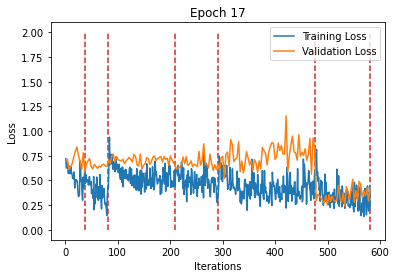

Train



Sequence:1, Seq Training Mean Loss: 0.5267258367022952, Seq Training Acc: 0.75
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.38429860207769606, Seq Training Acc: 0.8256944444444444
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.49973657164048024, Seq Training Acc: 0.7551673228346457
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4729130260828065, Seq Training Acc: 0.7682926829268293
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.4177543053755889, Seq Training Acc: 0.80625
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.3360627487015266, Seq Training Acc: 0.8419471153846154
******************************************************************
Epoch:18, Epoch Training Loss Mean: 0.43321171402931213, Epoch Training Acc: 0.7940193965517242
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6684060345093409, Seq Valid Acc: 0.6067708333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6292591492335001, Seq Valid Acc: 0.675



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7203481112207685, Seq Valid Acc: 0.49107142857142855



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6874974540301731, Seq Valid Acc: 0.5647321428571429



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.7133137358993781, Seq Valid Acc: 0.5681352459016393



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.3660033413342067, Seq Valid Acc: 0.8669642857142857
Epoch:18, Epoch Valid Mean Loss: 0.638790488243103, Epoch Valid Acc: 0.615770725388601
******************************************************************


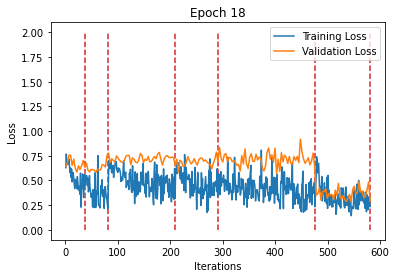

Train



Sequence:1, Seq Training Mean Loss: 0.4450387946657232, Seq Training Acc: 0.8032094594594594
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4005083551009496, Seq Training Acc: 0.8083333333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.5122231296666964, Seq Training Acc: 0.7399114173228346
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.49119531054322313, Seq Training Acc: 0.7534298780487805
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.39882671792764923, Seq Training Acc: 0.816554054054054
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.35810766075379574, Seq Training Acc: 0.8380408653846154
******************************************************************
Epoch:19, Epoch Training Loss Mean: 0.43249276280403137, Epoch Training Acc: 0.7932112068965518
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6467697521050771, Seq Valid Acc: 0.625



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6409897963205974, Seq Valid Acc: 0.6770833333333334



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6925266087055206, Seq Valid Acc: 0.5602678571428571



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6912075110844204, Seq Valid Acc: 0.625



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.7535232139415429, Seq Valid Acc: 0.6270491803278688



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.335368144937924, Seq Valid Acc: 0.85
Epoch:19, Epoch Valid Mean Loss: 0.6399938464164734, Epoch Valid Acc: 0.6564119170984456
******************************************************************


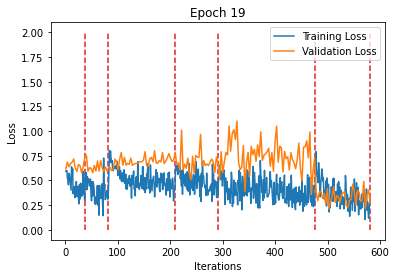

Train



Sequence:1, Seq Training Mean Loss: 0.4105791626749812, Seq Training Acc: 0.8226351351351351
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3860174967183007, Seq Training Acc: 0.8319444444444445
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.47742003038173586, Seq Training Acc: 0.7677165354330708
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4461794864477181, Seq Training Acc: 0.7869664634146342
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.40861110582544996, Seq Training Acc: 0.8133445945945946
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.3298653041800627, Seq Training Acc: 0.8521634615384616
******************************************************************
Epoch:20, Epoch Training Loss Mean: 0.4132419526576996, Epoch Training Acc: 0.8086206896551724
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5853808919588724, Seq Valid Acc: 0.71875



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5977380394935607, Seq Valid Acc: 0.6916666666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.7161404518854051, Seq Valid Acc: 0.5275297619047619



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6831542530230114, Seq Valid Acc: 0.6272321428571429



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6341280468174668, Seq Valid Acc: 0.6603483606557377



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.32502150024686544, Seq Valid Acc: 0.8616071428571429
Epoch:20, Epoch Valid Mean Loss: 0.5971732139587402, Epoch Valid Acc: 0.6692033678756477
******************************************************************


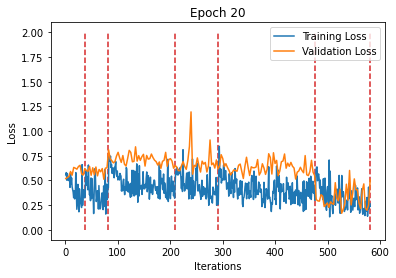

Train



Sequence:1, Seq Training Mean Loss: 0.41763427128662933, Seq Training Acc: 0.8133445945945946
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.36451898217201234, Seq Training Acc: 0.8388888888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.47083064913749695, Seq Training Acc: 0.7677165354330708
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4637156565014909, Seq Training Acc: 0.772484756097561
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.3815188780024245, Seq Training Acc: 0.8290540540540541
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.33806098037614274, Seq Training Acc: 0.8416466346153846
******************************************************************
Epoch:21, Epoch Training Loss Mean: 0.40588852763175964, Epoch Training Acc: 0.8096443965517242
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.6168752759695053, Seq Valid Acc: 0.703125



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6674088994661967, Seq Valid Acc: 0.6166666666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6648709703059423, Seq Valid Acc: 0.5959821428571429



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6319873056241444, Seq Valid Acc: 0.6261160714285714



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.8053477914606939, Seq Valid Acc: 0.5932377049180327



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.45285730617386954, Seq Valid Acc: 0.8026785714285715
Epoch:21, Epoch Valid Mean Loss: 0.6632646918296814, Epoch Valid Acc: 0.6452396373056994
******************************************************************


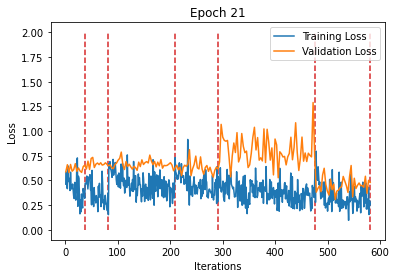

Train



Sequence:1, Seq Training Mean Loss: 0.3997696630052618, Seq Training Acc: 0.8175675675675675
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.4302478194236755, Seq Training Acc: 0.7916666666666666
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4660847090830014, Seq Training Acc: 0.7780511811023622
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.45915255023211965, Seq Training Acc: 0.7732469512195121
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.38690444843189137, Seq Training Acc: 0.8241554054054054
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.31649506364304286, Seq Training Acc: 0.8548677884615384
******************************************************************
Epoch:22, Epoch Training Loss Mean: 0.406015008687973, Epoch Training Acc: 0.8094288793103448
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.580918883283933, Seq Valid Acc: 0.71875



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6062789758046468, Seq Valid Acc: 0.7125



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6489472502753848, Seq Valid Acc: 0.6294642857142857



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6453118409429278, Seq Valid Acc: 0.6529017857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6469381466263631, Seq Valid Acc: 0.6557377049180327



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.34855522555964336, Seq Valid Acc: 0.8491071428571428
Epoch:22, Epoch Valid Mean Loss: 0.5857636332511902, Epoch Valid Acc: 0.6930051813471503
******************************************************************


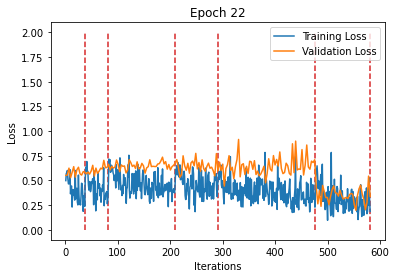

Train



Sequence:1, Seq Training Mean Loss: 0.39958892319653483, Seq Training Acc: 0.8234797297297297
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.40909239417976806, Seq Training Acc: 0.8208333333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.43948097081165616, Seq Training Acc: 0.7918307086614174
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4376438250992356, Seq Training Acc: 0.7911585365853658
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.3837544175821382, Seq Training Acc: 0.8201013513513513
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.30513900532745397, Seq Training Acc: 0.8698918269230769
******************************************************************
Epoch:23, Epoch Training Loss Mean: 0.3924548923969269, Epoch Training Acc: 0.8190193965517242
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.575179194410642, Seq Valid Acc: 0.7057291666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6313066045443217, Seq Valid Acc: 0.6625



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6760636369387308, Seq Valid Acc: 0.5729166666666666



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6652619476829257, Seq Valid Acc: 0.6227678571428571



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.668870703607309, Seq Valid Acc: 0.6224385245901639



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.38168775141239164, Seq Valid Acc: 0.8401785714285714
Epoch:23, Epoch Valid Mean Loss: 0.6090877652168274, Epoch Valid Acc: 0.6594883419689119
******************************************************************


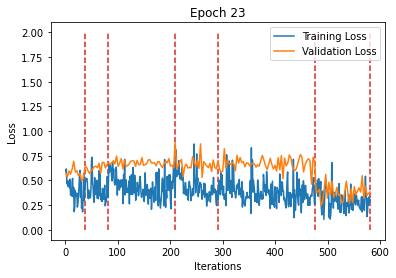

Train



Sequence:1, Seq Training Mean Loss: 0.36396494145328934, Seq Training Acc: 0.8327702702702703
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.39137750102414026, Seq Training Acc: 0.8243055555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.43020376727336973, Seq Training Acc: 0.7955216535433071
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.437999695357753, Seq Training Acc: 0.7945884146341463
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.37305295918438885, Seq Training Acc: 0.8287162162162162
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.2897086055376209, Seq Training Acc: 0.8746995192307693
******************************************************************
Epoch:24, Epoch Training Loss Mean: 0.38064661622047424, Epoch Training Acc: 0.8247844827586207
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.46536386013031006, Seq Valid Acc: 0.7786458333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.6217467268308003, Seq Valid Acc: 0.6979166666666666



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6796451140017736, Seq Valid Acc: 0.5870535714285714



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6184912834848676, Seq Valid Acc: 0.6517857142857143



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.7909918163643509, Seq Valid Acc: 0.6357581967213115



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.5315835416316986, Seq Valid Acc: 0.7473214285714286
Epoch:24, Epoch Valid Mean Loss: 0.6612918972969055, Epoch Valid Acc: 0.6614313471502591
******************************************************************


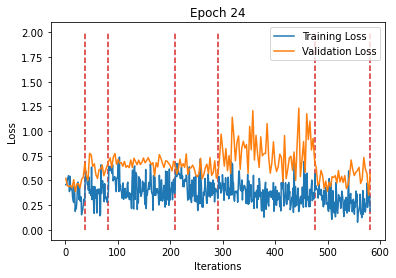

Train



Sequence:1, Seq Training Mean Loss: 0.3758065434726509, Seq Training Acc: 0.8184121621621622
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3707130518224504, Seq Training Acc: 0.8354166666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4181612619734186, Seq Training Acc: 0.8031496062992126
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4200570012738065, Seq Training Acc: 0.7934451219512195
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.36955676215725974, Seq Training Acc: 0.833277027027027
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.30288655009980386, Seq Training Acc: 0.859375
******************************************************************
Epoch:25, Epoch Training Loss Mean: 0.3758729100227356, Epoch Training Acc: 0.8249461206896552
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.5362824822465578, Seq Valid Acc: 0.7421875



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5927521109580993, Seq Valid Acc: 0.7125



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6284375687440237, Seq Valid Acc: 0.6607142857142857



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6364886526550565, Seq Valid Acc: 0.6629464285714286



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6611298156566308, Seq Valid Acc: 0.663422131147541



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.43963834728513446, Seq Valid Acc: 0.7964285714285714
Epoch:25, Epoch Valid Mean Loss: 0.5971968770027161, Epoch Valid Acc: 0.6955958549222798
******************************************************************


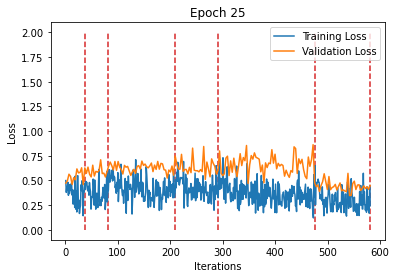

Train



Sequence:1, Seq Training Mean Loss: 0.3243622932885144, Seq Training Acc: 0.8614864864864865
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3431549254390929, Seq Training Acc: 0.8534722222222222
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4052323056018259, Seq Training Acc: 0.8088090551181102
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4046838212667442, Seq Training Acc: 0.8090701219512195
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.3467939574170757, Seq Training Acc: 0.8403716216216216
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.28414241711680704, Seq Training Acc: 0.8692908653846154
******************************************************************
Epoch:26, Epoch Training Loss Mean: 0.35482698678970337, Epoch Training Acc: 0.836584051724138
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.37502169236540794, Seq Valid Acc: 0.8619791666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5234815796216329, Seq Valid Acc: 0.75625



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6624762046904791, Seq Valid Acc: 0.6011904761904762



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6059184265988213, Seq Valid Acc: 0.6953125



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.56845573519097, Seq Valid Acc: 0.7069672131147541



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.6836556826319014, Seq Valid Acc: 0.6544642857142857
Epoch:26, Epoch Valid Mean Loss: 0.5997199416160583, Epoch Valid Acc: 0.6862046632124352
******************************************************************


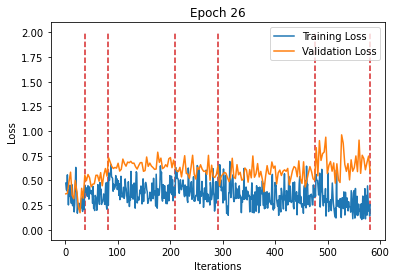

Train



Sequence:1, Seq Training Mean Loss: 0.3089165061309531, Seq Training Acc: 0.8614864864864865
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.34146187437905207, Seq Training Acc: 0.8416666666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.4049255818597914, Seq Training Acc: 0.812992125984252
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4227968868685932, Seq Training Acc: 0.8033536585365854
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.33725444344249933, Seq Training Acc: 0.8501689189189189
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.2778950280581529, Seq Training Acc: 0.875
******************************************************************
Epoch:27, Epoch Training Loss Mean: 0.35204094648361206, Epoch Training Acc: 0.8399245689655173
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.4641569033265114, Seq Valid Acc: 0.8333333333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5601330399513245, Seq Valid Acc: 0.7333333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6052678610597338, Seq Valid Acc: 0.6688988095238095



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.5562396528465408, Seq Valid Acc: 0.7020089285714286



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5538506664213587, Seq Valid Acc: 0.7167008196721312



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.6808426448277065, Seq Valid Acc: 0.6410714285714286
Epoch:27, Epoch Valid Mean Loss: 0.58332759141922, Epoch Valid Acc: 0.6989961139896373
******************************************************************


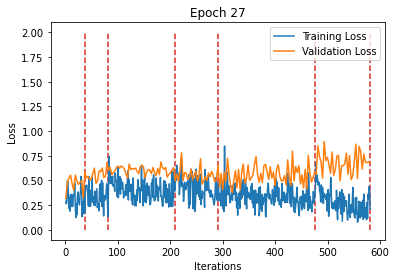

Train



Sequence:1, Seq Training Mean Loss: 0.3203964507257616, Seq Training Acc: 0.8538851351351351
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3460005395942264, Seq Training Acc: 0.8423611111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.40287816430640033, Seq Training Acc: 0.8095472440944882
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4086688617017211, Seq Training Acc: 0.8067835365853658
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.3467209830477431, Seq Training Acc: 0.8467905405405406
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.26430313016932744, Seq Training Acc: 0.8858173076923077
******************************************************************
Epoch:28, Epoch Training Loss Mean: 0.35126203298568726, Epoch Training Acc: 0.8400862068965518
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.4264253129561742, Seq Valid Acc: 0.8255208333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.49750036199887593, Seq Valid Acc: 0.7708333333333334



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6056437095006307, Seq Valid Acc: 0.6748511904761905



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6386703125068119, Seq Valid Acc: 0.6729910714285714



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5829205439716089, Seq Valid Acc: 0.7202868852459017



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.25217375116688867, Seq Valid Acc: 0.8901785714285714
Epoch:28, Epoch Valid Mean Loss: 0.5196043848991394, Epoch Valid Acc: 0.7448186528497409
******************************************************************


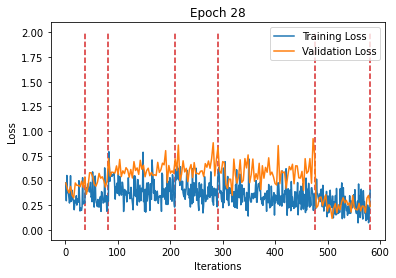

Train



Sequence:1, Seq Training Mean Loss: 0.2955123363314448, Seq Training Acc: 0.8547297297297297
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.31941480769051445, Seq Training Acc: 0.8555555555555555
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3628510598122604, Seq Training Acc: 0.8299704724409449
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.39150087480864876, Seq Training Acc: 0.8163109756097561
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.32684932955213497, Seq Training Acc: 0.8554054054054054
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.2642145591716354, Seq Training Acc: 0.8852163461538461
******************************************************************
Epoch:29, Epoch Training Loss Mean: 0.33006590604782104, Epoch Training Acc: 0.8496228448275862
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.425421175857385, Seq Valid Acc: 0.8020833333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.4668889423211416, Seq Valid Acc: 0.8083333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.6349949141343435, Seq Valid Acc: 0.6629464285714286



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.605535449726241, Seq Valid Acc: 0.7075892857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5554229724602621, Seq Valid Acc: 0.7238729508196722



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.2630675705415862, Seq Valid Acc: 0.8910714285714286
Epoch:29, Epoch Valid Mean Loss: 0.5120276212692261, Epoch Valid Acc: 0.75
******************************************************************


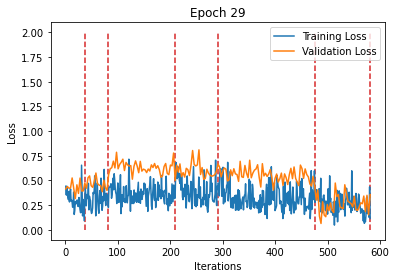

Train



Sequence:1, Seq Training Mean Loss: 0.2985460335338438, Seq Training Acc: 0.8648648648648649
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.33856409821245403, Seq Training Acc: 0.8409722222222222
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.36785035140401734, Seq Training Acc: 0.8260334645669292
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.4103515220851433, Seq Training Acc: 0.7987804878048781
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.3210859143250697, Seq Training Acc: 0.8518581081081081
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.2469315596211415, Seq Training Acc: 0.8927283653846154
******************************************************************
Epoch:30, Epoch Training Loss Mean: 0.3305675685405731, Epoch Training Acc: 0.8460129310344827
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.42525915677348775, Seq Valid Acc: 0.8072916666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.4982152938842773, Seq Valid Acc: 0.7479166666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.5923808039653868, Seq Valid Acc: 0.6927083333333334



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.5277001581021717, Seq Valid Acc: 0.7444196428571429



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5009419986459075, Seq Valid Acc: 0.7658811475409836



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.3945987684386117, Seq Valid Acc: 0.8125
Epoch:30, Epoch Valid Mean Loss: 0.5005199909210205, Epoch Valid Acc: 0.7564766839378239
******************************************************************


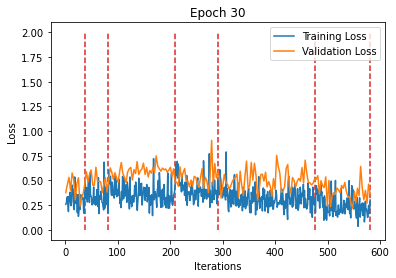

Train



Sequence:1, Seq Training Mean Loss: 0.2806392573827022, Seq Training Acc: 0.870777027027027
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3171773854229185, Seq Training Acc: 0.8486111111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3641794573838317, Seq Training Acc: 0.8287401574803149
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3768740968733299, Seq Training Acc: 0.8208841463414634
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.30985938487826165, Seq Training Acc: 0.8652027027027027
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.2514092459415014, Seq Training Acc: 0.8915264423076923
******************************************************************
Epoch:31, Epoch Training Loss Mean: 0.31945112347602844, Epoch Training Acc: 0.8547413793103448
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.4242108191053073, Seq Valid Acc: 0.828125



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.4296220680077871, Seq Valid Acc: 0.8



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.599374553277379, Seq Valid Acc: 0.6651785714285714



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.604651190340519, Seq Valid Acc: 0.6752232142857143



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5402323872339531, Seq Valid Acc: 0.7295081967213115



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.45048460066318513, Seq Valid Acc: 0.7857142857142857
Epoch:31, Epoch Valid Mean Loss: 0.5303625464439392, Epoch Valid Acc: 0.7294365284974094
******************************************************************


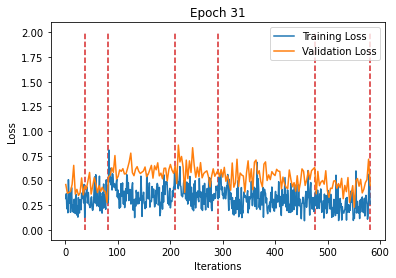

Train



Sequence:1, Seq Training Mean Loss: 0.282962096301285, Seq Training Acc: 0.8910472972972973
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.331809969080819, Seq Training Acc: 0.8548611111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.34661744617101714, Seq Training Acc: 0.8378444881889764
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3768462055340046, Seq Training Acc: 0.823170731707317
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.31326674303492985, Seq Training Acc: 0.8614864864864865
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.23758601354291806, Seq Training Acc: 0.8972355769230769
******************************************************************
Epoch:32, Epoch Training Loss Mean: 0.3154933452606201, Epoch Training Acc: 0.8586745689655172
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.36114328106244403, Seq Valid Acc: 0.875



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.5195207059383392, Seq Valid Acc: 0.7583333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.5377320718197596, Seq Valid Acc: 0.7425595238095238



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.5916440220815795, Seq Valid Acc: 0.6875



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6414321235945968, Seq Valid Acc: 0.6895491803278688



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.32432337062699457, Seq Valid Acc: 0.8544642857142857
Epoch:32, Epoch Valid Mean Loss: 0.5272330641746521, Epoch Valid Acc: 0.747571243523316
******************************************************************


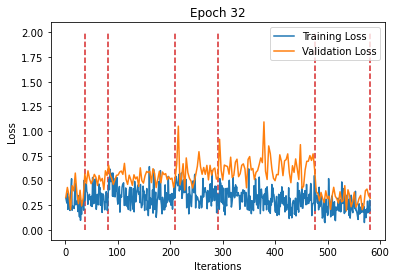

Train



Sequence:1, Seq Training Mean Loss: 0.23132630659116282, Seq Training Acc: 0.8969594594594594
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.3253939714696672, Seq Training Acc: 0.8520833333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3374625225001433, Seq Training Acc: 0.8513779527559056
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.35376776836630774, Seq Training Acc: 0.8376524390243902
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.2962269702070468, Seq Training Acc: 0.8682432432432432
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.23278507679844132, Seq Training Acc: 0.8957331730769231
******************************************************************
Epoch:33, Epoch Training Loss Mean: 0.3001381754875183, Epoch Training Acc: 0.8657327586206897
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.40055660158395767, Seq Valid Acc: 0.8177083333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.4941255569458008, Seq Valid Acc: 0.7520833333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.49096271040893735, Seq Valid Acc: 0.7626488095238095



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.6244733567748751, Seq Valid Acc: 0.6919642857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5714457489427973, Seq Valid Acc: 0.7248975409836066



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.40145469648497445, Seq Valid Acc: 0.8053571428571429
Epoch:33, Epoch Valid Mean Loss: 0.5141624808311462, Epoch Valid Acc: 0.750809585492228
******************************************************************


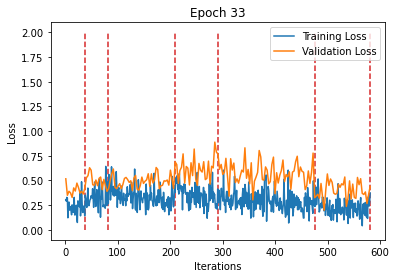

Train



Sequence:1, Seq Training Mean Loss: 0.2754095597444354, Seq Training Acc: 0.8817567567567568
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.31597168180677626, Seq Training Acc: 0.85
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3301344191816848, Seq Training Acc: 0.8484251968503937
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.37143615051740553, Seq Training Acc: 0.8277439024390244
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.30177110204020063, Seq Training Acc: 0.8665540540540541
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.21991581878123376, Seq Training Acc: 0.9080528846153846
******************************************************************
Epoch:34, Epoch Training Loss Mean: 0.30257347226142883, Epoch Training Acc: 0.8642241379310345
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.35990679264068604, Seq Valid Acc: 0.8489583333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.4796234091122945, Seq Valid Acc: 0.7875



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.5591572601170767, Seq Valid Acc: 0.7180059523809523



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.5016703935606139, Seq Valid Acc: 0.7488839285714286



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5151923445404553, Seq Valid Acc: 0.7546106557377049



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.4522685021162033, Seq Valid Acc: 0.7758928571428572
Epoch:34, Epoch Valid Mean Loss: 0.4989675283432007, Epoch Valid Acc: 0.7580958549222798
******************************************************************


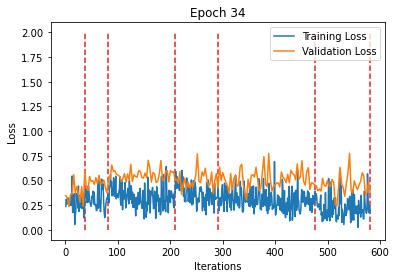

Train



Sequence:1, Seq Training Mean Loss: 0.23648512202340202, Seq Training Acc: 0.8961148648648649
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.29535995887385474, Seq Training Acc: 0.8625
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3350578032609985, Seq Training Acc: 0.8420275590551181
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3759404488089608, Seq Training Acc: 0.8189786585365854
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.28727300159029057, Seq Training Acc: 0.8739864864864865
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.21657106437935278, Seq Training Acc: 0.9083533653846154
******************************************************************
Epoch:35, Epoch Training Loss Mean: 0.2949818968772888, Epoch Training Acc: 0.8658943965517242
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.268248725682497, Seq Valid Acc: 0.9010416666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.4287732044855754, Seq Valid Acc: 0.7916666666666666



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.5004208584626516, Seq Valid Acc: 0.7589285714285714



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.5605445206165314, Seq Valid Acc: 0.7254464285714286



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6219239659973832, Seq Valid Acc: 0.7151639344262295



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.5829097662653242, Seq Valid Acc: 0.7276785714285714
Epoch:35, Epoch Valid Mean Loss: 0.5425010919570923, Epoch Valid Acc: 0.7459520725388601
******************************************************************


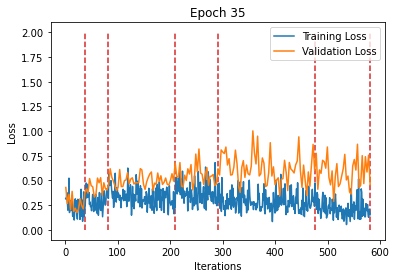

Train



Sequence:1, Seq Training Mean Loss: 0.24039754553421125, Seq Training Acc: 0.8885135135135135
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2836908780866199, Seq Training Acc: 0.8763888888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.31237998874638023, Seq Training Acc: 0.8604822834645669
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.34436062995980427, Seq Training Acc: 0.8422256097560976
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.2803123693611171, Seq Training Acc: 0.8758445945945946
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.2009389906261976, Seq Training Acc: 0.9122596153846154
******************************************************************
Epoch:36, Epoch Training Loss Mean: 0.2798725664615631, Epoch Training Acc: 0.8751077586206897
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.3142424213389556, Seq Valid Acc: 0.8411458333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.40385804573694867, Seq Valid Acc: 0.80625



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.43364610203674864, Seq Valid Acc: 0.7879464285714286



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.45733106029885157, Seq Valid Acc: 0.7857142857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.525389526955417, Seq Valid Acc: 0.757172131147541



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.35531753812517436, Seq Valid Acc: 0.8401785714285714
Epoch:36, Epoch Valid Mean Loss: 0.4421350061893463, Epoch Valid Acc: 0.792098445595855
******************************************************************


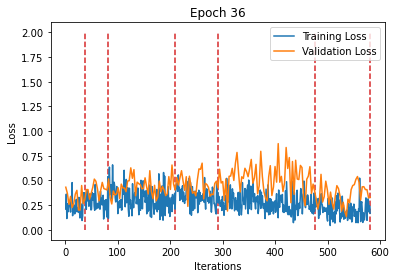

Train



Sequence:1, Seq Training Mean Loss: 0.23569096322800662, Seq Training Acc: 0.8944256756756757
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2541017911500401, Seq Training Acc: 0.89375
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.32165494349997814, Seq Training Acc: 0.8479330708661418
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.3481174558401108, Seq Training Acc: 0.8353658536585366
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.28331894818189984, Seq Training Acc: 0.8817567567567568
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.21097207069396973, Seq Training Acc: 0.9044471153846154
******************************************************************
Epoch:37, Epoch Training Loss Mean: 0.2825966775417328, Epoch Training Acc: 0.8735991379310345
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.3231338808933894, Seq Valid Acc: 0.8515625



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.41140976548194885, Seq Valid Acc: 0.7958333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.4696884573925109, Seq Valid Acc: 0.7693452380952381



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.4569229004638536, Seq Valid Acc: 0.7790178571428571



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5103028822140615, Seq Valid Acc: 0.7628073770491803



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.33210708328655786, Seq Valid Acc: 0.8401785714285714
Epoch:37, Epoch Valid Mean Loss: 0.4420815110206604, Epoch Valid Acc: 0.7886981865284974
******************************************************************


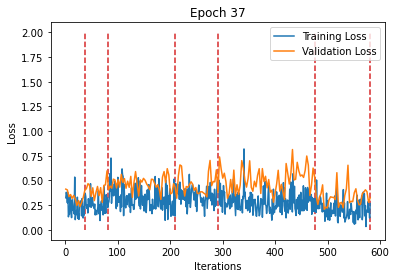

Train



Sequence:1, Seq Training Mean Loss: 0.21518004645366925, Seq Training Acc: 0.9155405405405406
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2587384440832668, Seq Training Acc: 0.8881944444444444
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.29950950535263604, Seq Training Acc: 0.8649114173228346
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.32944320087752693, Seq Training Acc: 0.8517530487804879
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.26738391381663246, Seq Training Acc: 0.8809121621621622
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.19334015902131796, Seq Training Acc: 0.91796875
******************************************************************
Epoch:38, Epoch Training Loss Mean: 0.2659143805503845, Epoch Training Acc: 0.8827047413793103
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.2803643134733041, Seq Valid Acc: 0.8828125



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.39311752319335935, Seq Valid Acc: 0.8375



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.4281048370259149, Seq Valid Acc: 0.7991071428571429



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.5211776505623545, Seq Valid Acc: 0.7466517857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6458617077499139, Seq Valid Acc: 0.7382172131147541



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.25257338157721926, Seq Valid Acc: 0.8883928571428571
Epoch:38, Epoch Valid Mean Loss: 0.46669504046440125, Epoch Valid Acc: 0.7966321243523317
******************************************************************


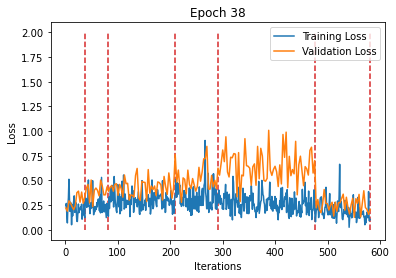

Train



Sequence:1, Seq Training Mean Loss: 0.239983371383435, Seq Training Acc: 0.8927364864864865
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2754899455441369, Seq Training Acc: 0.8729166666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.3102070488563673, Seq Training Acc: 0.8580216535433071
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.32223808529173453, Seq Training Acc: 0.848704268292683
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.25518548786640166, Seq Training Acc: 0.8868243243243243
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.17380166741517875, Seq Training Acc: 0.9245793269230769
******************************************************************
Epoch:39, Epoch Training Loss Mean: 0.26272574067115784, Epoch Training Acc: 0.8811961206896551
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.2606318121155103, Seq Valid Acc: 0.8880208333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.39592524369557697, Seq Valid Acc: 0.8270833333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.4254660890215919, Seq Valid Acc: 0.8020833333333334



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.4519020052892821, Seq Valid Acc: 0.7924107142857143



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.49238387165499514, Seq Valid Acc: 0.7761270491803278



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.34384589493274687, Seq Valid Acc: 0.8455357142857143
Epoch:39, Epoch Valid Mean Loss: 0.42310523986816406, Epoch Valid Acc: 0.8076424870466321
******************************************************************


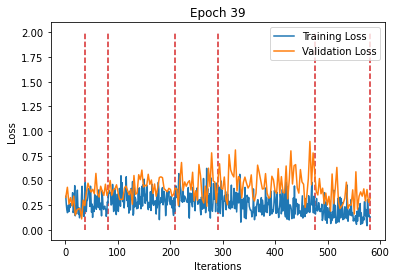

Train



Sequence:1, Seq Training Mean Loss: 0.22064689848874067, Seq Training Acc: 0.8978040540540541
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.25650812437136966, Seq Training Acc: 0.8833333333333333
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.30286580206840996, Seq Training Acc: 0.859005905511811
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2962057319719617, Seq Training Acc: 0.8616615853658537
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.24695501307377943, Seq Training Acc: 0.8925675675675676
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.1923350358668428, Seq Training Acc: 0.9107572115384616
******************************************************************
Epoch:40, Epoch Training Loss Mean: 0.25542953610420227, Epoch Training Acc: 0.883728448275862
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.2754346902171771, Seq Valid Acc: 0.8828125



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.3611882468064626, Seq Valid Acc: 0.85



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.40756743862515404, Seq Valid Acc: 0.8102678571428571



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.4203021377325058, Seq Valid Acc: 0.8002232142857143



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.4434860949633551, Seq Valid Acc: 0.7945696721311475



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.29531374126672744, Seq Valid Acc: 0.8767857142857143
Epoch:40, Epoch Valid Mean Loss: 0.3885904550552368, Epoch Valid Acc: 0.8235103626943006
******************************************************************


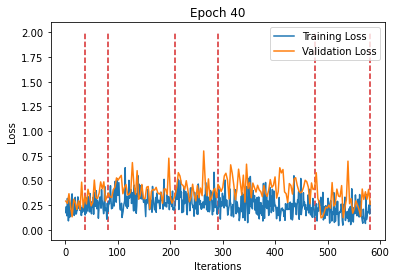

Train



Sequence:1, Seq Training Mean Loss: 0.2044538644117278, Seq Training Acc: 0.9113175675675675
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.26877954138649834, Seq Training Acc: 0.875
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2945526367801381, Seq Training Acc: 0.8695866141732284
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.28577416499213476, Seq Training Acc: 0.8696646341463414
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.25000376612753483, Seq Training Acc: 0.8886824324324324
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.17949638730631426, Seq Training Acc: 0.9212740384615384
******************************************************************
Epoch:41, Epoch Training Loss Mean: 0.2507238984107971, Epoch Training Acc: 0.8880387931034482
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.2996383458375931, Seq Valid Acc: 0.8645833333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.3696735362211863, Seq Valid Acc: 0.825



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.4137246030427161, Seq Valid Acc: 0.7998511904761905



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.5159185390387263, Seq Valid Acc: 0.7544642857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6658468964647074, Seq Valid Acc: 0.7172131147540983



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.28168318143912724, Seq Valid Acc: 0.8642857142857143
Epoch:41, Epoch Valid Mean Loss: 0.47377458214759827, Epoch Valid Acc: 0.7848121761658031
******************************************************************


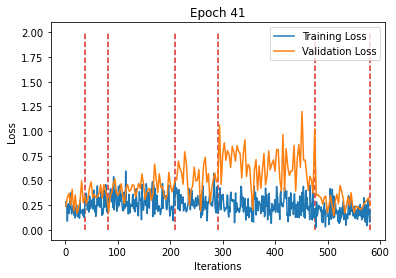

Train



Sequence:1, Seq Training Mean Loss: 0.2122009370375324, Seq Training Acc: 0.9054054054054054
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2534456764658292, Seq Training Acc: 0.8826388888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.28240479135841834, Seq Training Acc: 0.8720472440944882
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.31223492324352264, Seq Training Acc: 0.8521341463414634
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.24418156481272466, Seq Training Acc: 0.8880067567567568
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.18354371225891206, Seq Training Acc: 0.9170673076923077
******************************************************************
Epoch:42, Epoch Training Loss Mean: 0.24997811019420624, Epoch Training Acc: 0.8853448275862069
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.3052483896414439, Seq Valid Acc: 0.8776041666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.33767605423927305, Seq Valid Acc: 0.8458333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.39791103629838853, Seq Valid Acc: 0.8013392857142857



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.5189135457788195, Seq Valid Acc: 0.7756696428571429



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5912898827771671, Seq Valid Acc: 0.7556352459016393



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.36761989295482633, Seq Valid Acc: 0.8348214285714286
Epoch:42, Epoch Valid Mean Loss: 0.46064943075180054, Epoch Valid Acc: 0.7974417098445595
******************************************************************


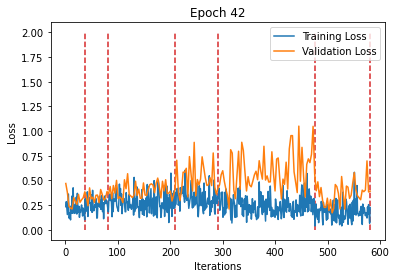

Train



Sequence:1, Seq Training Mean Loss: 0.2399414403213037, Seq Training Acc: 0.9011824324324325
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.28297837211026083, Seq Training Acc: 0.8694444444444445
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.29657566523927403, Seq Training Acc: 0.8634350393700787
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2801259229095971, Seq Training Acc: 0.868140243902439
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.2531355784954252, Seq Training Acc: 0.8875
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.1725596568117348, Seq Training Acc: 0.9233774038461539
******************************************************************
Epoch:43, Epoch Training Loss Mean: 0.2534889578819275, Epoch Training Acc: 0.8853987068965518
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.24286287650465965, Seq Valid Acc: 0.9140625



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.3557656625906626, Seq Valid Acc: 0.8229166666666666



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.34504502089250655, Seq Valid Acc: 0.8459821428571429



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.40669179069144384, Seq Valid Acc: 0.8046875



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5449920457894685, Seq Valid Acc: 0.7786885245901639



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.3017163240483829, Seq Valid Acc: 0.8589285714285714
Epoch:43, Epoch Valid Mean Loss: 0.4038066565990448, Epoch Valid Acc: 0.8235103626943006
******************************************************************


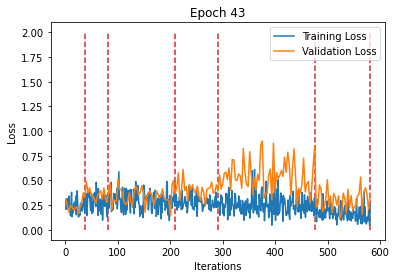

Train



Sequence:1, Seq Training Mean Loss: 0.21061911514481982, Seq Training Acc: 0.9079391891891891
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.25968836893637975, Seq Training Acc: 0.8888888888888888
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2777898128577105, Seq Training Acc: 0.8722933070866141
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.28321751116252525, Seq Training Acc: 0.8677591463414634
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.2425507301414335, Seq Training Acc: 0.887668918918919
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.18220670292010674, Seq Training Acc: 0.921875
******************************************************************
Epoch:44, Epoch Training Loss Mean: 0.24448862671852112, Epoch Training Acc: 0.8890086206896551
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.307770265887181, Seq Valid Acc: 0.8489583333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.32427377700805665, Seq Valid Acc: 0.8791666666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.3644735323531287, Seq Valid Acc: 0.8258928571428571



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.48347530514001846, Seq Valid Acc: 0.7689732142857143



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5611331550801386, Seq Valid Acc: 0.7663934426229508



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.34739030855042596, Seq Valid Acc: 0.8321428571428572
Epoch:44, Epoch Valid Mean Loss: 0.43414679169654846, Epoch Valid Acc: 0.8055375647668394
******************************************************************


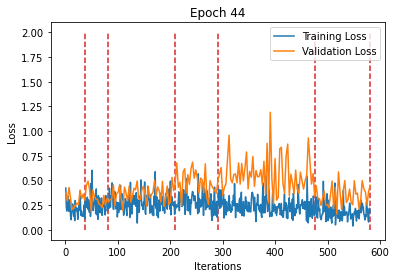

Train



Sequence:1, Seq Training Mean Loss: 0.18935488768526026, Seq Training Acc: 0.9180743243243243
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2459259010023541, Seq Training Acc: 0.8986111111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.29090286333729903, Seq Training Acc: 0.8722933070866141
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2864513916940224, Seq Training Acc: 0.866234756097561
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.24529741748764708, Seq Training Acc: 0.8900337837837838
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.1561603323699763, Seq Training Acc: 0.9338942307692307
******************************************************************
Epoch:45, Epoch Training Loss Mean: 0.24159856140613556, Epoch Training Acc: 0.8931034482758621
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.24761019522945085, Seq Valid Acc: 0.8828125



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.3580569197734197, Seq Valid Acc: 0.8354166666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.3851734534615562, Seq Valid Acc: 0.8169642857142857



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.44133242326123373, Seq Valid Acc: 0.7879464285714286



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6430686770892534, Seq Valid Acc: 0.7423155737704918



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.35472086199692315, Seq Valid Acc: 0.8267857142857142
Epoch:45, Epoch Valid Mean Loss: 0.45864859223365784, Epoch Valid Acc: 0.7964702072538861
******************************************************************


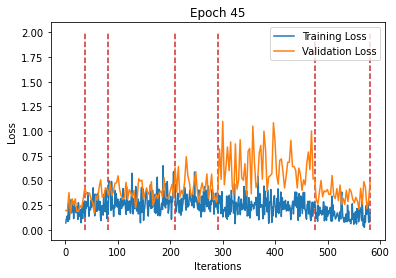

Train



Sequence:1, Seq Training Mean Loss: 0.18665494155642148, Seq Training Acc: 0.910472972972973
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2717023263374964, Seq Training Acc: 0.88125
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.26610335666598295, Seq Training Acc: 0.8791830708661418
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2896217247698365, Seq Training Acc: 0.859375
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.2228086526329453, Seq Training Acc: 0.9030405405405405
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.15986370058873525, Seq Training Acc: 0.9314903846153846
******************************************************************
Epoch:46, Epoch Training Loss Mean: 0.23193511366844177, Epoch Training Acc: 0.8955280172413793
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.2592010187606017, Seq Valid Acc: 0.8802083333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.318881889184316, Seq Valid Acc: 0.86875



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.35902551206804456, Seq Valid Acc: 0.8258928571428571



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.44031081774405073, Seq Valid Acc: 0.7924107142857143



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.6106312778152403, Seq Valid Acc: 0.7530737704918032



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.3516232682125909, Seq Valid Acc: 0.8392857142857143
Epoch:46, Epoch Valid Mean Loss: 0.43967223167419434, Epoch Valid Acc: 0.8071567357512953
******************************************************************


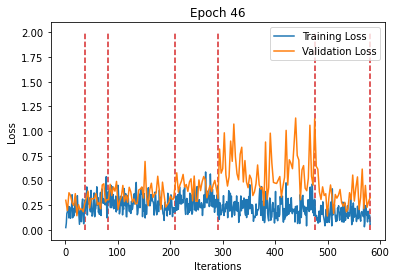

Train



Sequence:1, Seq Training Mean Loss: 0.19682082715066704, Seq Training Acc: 0.9096283783783784
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.26750023083554375, Seq Training Acc: 0.8826388888888889
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2745315627906266, Seq Training Acc: 0.874261811023622
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.30192220947001036, Seq Training Acc: 0.8586128048780488
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.23404742455160296, Seq Training Acc: 0.8967905405405405
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.16433671661294424, Seq Training Acc: 0.9296875
******************************************************************
Epoch:47, Epoch Training Loss Mean: 0.24022895097732544, Epoch Training Acc: 0.8920797413793103
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.2707890396316846, Seq Valid Acc: 0.8776041666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.34576983948548634, Seq Valid Acc: 0.8354166666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.3481432061110224, Seq Valid Acc: 0.8311011904761905



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.45157524038638386, Seq Valid Acc: 0.7924107142857143



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5366624728089473, Seq Valid Acc: 0.766905737704918



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.3292463315384729, Seq Valid Acc: 0.8598214285714286
Epoch:47, Epoch Valid Mean Loss: 0.4143117666244507, Epoch Valid Acc: 0.8136334196891192
******************************************************************


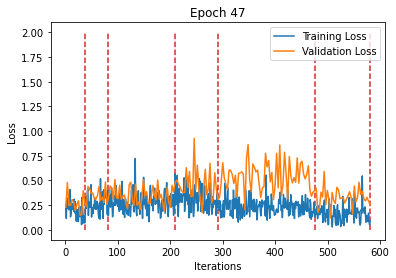

Train



Sequence:1, Seq Training Mean Loss: 0.2005293486086098, Seq Training Acc: 0.9130067567567568
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.24619257930252286, Seq Training Acc: 0.8916666666666667
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.26696193136098817, Seq Training Acc: 0.8818897637795275
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.28650105253952307, Seq Training Acc: 0.8727134146341463
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.2382322077815597, Seq Training Acc: 0.8930743243243243
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.15934152005670163, Seq Training Acc: 0.9338942307692307
******************************************************************
Epoch:48, Epoch Training Loss Mean: 0.23541375994682312, Epoch Training Acc: 0.8962284482758621
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.30068255215883255, Seq Valid Acc: 0.8333333333333334



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.33045169909795125, Seq Valid Acc: 0.8708333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.34904813837437404, Seq Valid Acc: 0.8363095238095238



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.4341455086001328, Seq Valid Acc: 0.7979910714285714



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.501433999323454, Seq Valid Acc: 0.7868852459016393



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.368162619641849, Seq Valid Acc: 0.8196428571428571
Epoch:48, Epoch Valid Mean Loss: 0.40857115387916565, Epoch Valid Acc: 0.8146049222797928
******************************************************************


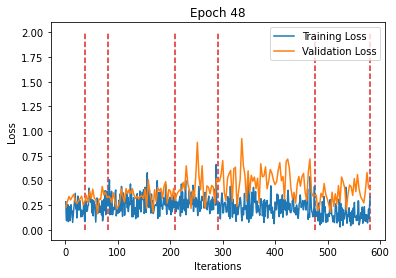

Train



Sequence:1, Seq Training Mean Loss: 0.23810576506563136, Seq Training Acc: 0.8910472972972973
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2478307341535886, Seq Training Acc: 0.8888888888888888
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2639123457740611, Seq Training Acc: 0.8833661417322834
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2955632160713033, Seq Training Acc: 0.8612804878048781
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.23573954359099672, Seq Training Acc: 0.8910472972972973
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.17540141452963537, Seq Training Acc: 0.9272836538461539
******************************************************************
Epoch:49, Epoch Training Loss Mean: 0.24063605070114136, Epoch Training Acc: 0.8914870689655172
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.2930222476522128, Seq Valid Acc: 0.8776041666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.3247271011273066, Seq Valid Acc: 0.8729166666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.36529011527697247, Seq Valid Acc: 0.8199404761904762



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.48595631761210306, Seq Valid Acc: 0.7622767857142857



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.5668864548206329, Seq Valid Acc: 0.7551229508196722



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.4421215312821524, Seq Valid Acc: 0.7982142857142858
Epoch:49, Epoch Valid Mean Loss: 0.45280033349990845, Epoch Valid Acc: 0.7948510362694301
******************************************************************


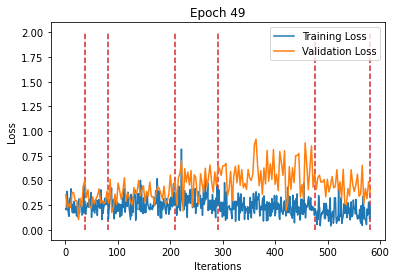

Train



Sequence:1, Seq Training Mean Loss: 0.21109581809188868, Seq Training Acc: 0.902027027027027
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2556602444913652, Seq Training Acc: 0.8861111111111111
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2636098860521016, Seq Training Acc: 0.8809055118110236
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.29202246302511636, Seq Training Acc: 0.8635670731707317
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.2226551918765983, Seq Training Acc: 0.9003378378378378
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.1666251306171314, Seq Training Acc: 0.9332932692307693
******************************************************************
Epoch:50, Epoch Training Loss Mean: 0.23320652544498444, Epoch Training Acc: 0.8957974137931034
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.2546658056477706, Seq Valid Acc: 0.8854166666666666



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.3346388300259908, Seq Valid Acc: 0.8458333333333333



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.36413715176639105, Seq Valid Acc: 0.8162202380952381



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.38531513831445147, Seq Valid Acc: 0.8147321428571429



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.573939958801035, Seq Valid Acc: 0.7587090163934426



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.49153464308806827, Seq Valid Acc: 0.7848214285714286
Epoch:50, Epoch Valid Mean Loss: 0.44752439856529236, Epoch Valid Acc: 0.7987370466321243
******************************************************************


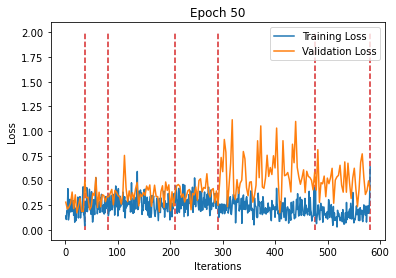


Save Model


NameError: name 'net_path' is not defined

In [24]:
if run_train:
    writer = SummaryWriter('runs/008_ResNet50_1stripe_4e-4')
    max_iter_per_seq = 600
    # 训练迭代总步数
    num_train_iter_per_epoch = 0
    num_train_iterations = [] # For plot parting line
    num_train_iterations_per_dl = [max_iter_per_seq if len(dl)>= max_iter_per_seq else len(dl) for dl in train_dls]
    for seq_dataloaders in dataloaders:
        if len(seq_dataloaders[train_dl_idx]) <= max_iter_per_seq:
            num_train_iter_per_epoch += len(seq_dataloaders[train_dl_idx])
        else:
            num_train_iter_per_epoch += max_iter_per_seq
        num_train_iterations.append(num_train_iter_per_epoch)
    print("Total Train Iterations: ",num_train_iter_per_epoch)
    print("Total Train Iterations List: ",num_train_iterations)
        
    # 训练迭代总步数为验证迭代总步数的3倍
    num_val_iterations = [int(number / 3) for number in num_train_iterations]
    num_val_iter_per_epoch = num_val_iterations[-1]
    
    # iterations in every seq
    num_val_iter_per_seq = []
    num_val_iter_per_seq.append(num_val_iterations[0])
    for i in range(len(num_val_iterations)-1):
        diff = num_val_iterations[i+1] - num_val_iterations[i] # The latter minus the former
        num_val_iter_per_seq.append(diff)
        
    print("Valid iterations per seq: ",num_val_iter_per_seq)
        
    optimizer = torch.optim.Adam(model.parameters(),lr=lr,eps=1e-08)

    scheduler = OneCycleLR(optimizer, num_train_iter_per_epoch, num_epochs, min_lr_factor=min_lr_factor)
    scheduler.step(epoch=0)
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.
    loss_min = 0.
    
    for epoch in tqdm(range(1,num_epochs+1)):

        print('Train')

        model.train()
        
        running_corrects = 0

        train_loss_array = np.zeros(num_train_iter_per_epoch, dtype=np.single)

        # mse_y = torch.zeros(batch_sizes[0]//2).to(device)
        
        i = 0
        seq_idx = 1
        for (refs, train_dl, max_num) in zip(refs_list, train_dls, num_train_iterations_per_dl):
            # obtain the refs in every seq
            
            curr_train_dl = train_dl

            curr_refs = refs.float().to(device)

            # Training
            dl_iter = iter(curr_train_dl)
            
            # This two only used to compute the loss and acc in every Sequence
            running_loss = 0
            corrects = 0
            for idx in tqdm(range(max_num)):
                if idx >= max_iter_per_seq:
                    break
                try:
                    img1, img2, targets = next(dl_iter)

                except (StopIteration, TypeError):
                    dl_iter = iter(curr_train_dl)
                    img1, img2, targets = next(dl_iter)
                
                scheduler.zero_grad()

                img1 = img1.float().to(device)
                img2 = img2.float().to(device)
                targets = targets.view(-1)
                targets = targets.float().to(device)

                # forward pass
                loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                
                loss.backward()
                
                running_loss += loss.item()
                corrects += torch.sum(preds == targets)
                running_corrects += torch.sum(preds == targets)

                train_loss_array[i] = loss.cpu().detach().numpy()
               
                
                # record loss and accuracy per iteration
                c = torch.sum(preds == targets)
                acc = int(c) / img1.size(0)
                writer.add_scalar('Train/Loss per Iteration',train_loss_array[i], ((epoch - 1) * num_train_iter_per_epoch)+ i)
                writer.add_scalar('Train/Acc per Iteration',acc, ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                # Record the lr
                curr_lr = get_lr(optimizer)
                writer.add_scalar('Train/Learning Rate',curr_lr , ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                i += 1
                scheduler.step()
            
            # record loss and accuracy in every train dataloader (namely every Sequence)
            #seq_train_mean_loss = running_loss / len(curr_train_dl)
            #seq_train_acc = int(corrects) / (len(curr_train_dl) * img1.size(0))
            seq_train_mean_loss = running_loss / max_num
            seq_train_acc = int(corrects) / (max_num * img1.size(0))
            
            print("Sequence:{}, Seq Training Mean Loss: {}, Seq Training Acc: {}".format(seq_idx, seq_train_mean_loss, seq_train_acc))
            print("******************************************************************")
            # Record the loss and acc in every Seq in Tensorboard
            writer.add_scalar('Train/Seq Training Mean Loss',seq_train_mean_loss, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Training Accuracy', seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Error Rate',1 - seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            
            seq_idx += 1
            
        # after one epoch update scheduler   
        # Plot lr policy
        curr_lr = get_lr(optimizer)
        writer.add_scalar('Train/Learning Rate Policy',curr_lr , epoch)
        writer.flush()
            
        # record loss and accuracy in every epoch (namely 6 Sequences)
        epoch_train_mean_loss = train_loss_array.mean()  # std
        epoch_train_acc = int(running_corrects) / (num_train_iter_per_epoch * img1.size(0))

        print("Epoch:{}, Epoch Training Loss Mean: {}, Epoch Training Acc: {}".format(epoch, epoch_train_mean_loss, epoch_train_acc))
        print("******************************************************************")
        
        ### Validation
        print('Validation')
        model.eval()
        val_loss_array = np.zeros(num_val_iter_per_epoch, dtype=np.single)
        
        running_corrects = 0

        i = 0
        with torch.no_grad():
            seq_idx = 1
            for (refs, valid_dl, max_num) in zip(refs_list,valid_dls, num_val_iter_per_seq):
                
                curr_valid_dl = valid_dl
                curr_refs = refs.float().to(device)
                iter_max_num = max_num
            
                dl_iter = iter(curr_valid_dl)
                # This two uesd to compute loss and accurary in every Seq
                running_loss = 0
                corrects = 0
                for dl_idx in tqdm(range(iter_max_num)):
                    try:
                        img1, img2, targets = next(dl_iter)
                    except (StopIteration, TypeError):
                        dl_iter = iter(curr_valid_dl)
                        img1, img2, targets = next(dl_iter)

                    img1 = img1.float().to(device)
                    img2 = img2.float().to(device)
                    targets = targets.view(-1)
                    targets = targets.float().to(device)
                
                    loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
                    running_loss += loss.item()
                    corrects += torch.sum(preds == targets)
                    running_corrects += torch.sum(preds == targets)
                    
                    # record loss and accuracy in every iteration
                    c = torch.sum(preds == targets)
                    acc = int(c) / img1.size(0)
                    writer.add_scalar('Validation/Loss per Iteration',loss.item(), ((epoch - 1) * num_val_iter_per_epoch)+ i)
                    writer.add_scalar('Validation/Acc per Iteration',acc, ((epoch - 1) * num_val_iter_per_epoch)+ i)

                    val_loss_array[i] = loss.cpu().detach().numpy()
                    i += 1
            
                #seq_val_mean_loss = running_loss / len(curr_valid_dl)
                #seq_val_acc = int(corrects) / (len(curr_valid_dl) * img1.size(0))
                seq_val_mean_loss = running_loss / iter_max_num
                seq_val_acc = int(corrects) / (iter_max_num * img1.size(0))
                print("******************************************************************")
                print("Sequence:{}, Seq Valid Mean Loss: {}, Seq Valid Acc: {}".format(seq_idx,seq_val_mean_loss, seq_val_acc))
                
                writer.add_scalar('Validation/Seq Mean Loss',seq_val_mean_loss, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Accuracy', seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Error Rate',1 - seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                
                seq_idx += 1
                
            epoch_val_mean_loss = val_loss_array.mean()  # std
            epoch_val_acc = int(running_corrects) / (num_val_iter_per_epoch * img1.size(0))

            print("Epoch:{}, Epoch Valid Mean Loss: {}, Epoch Valid Acc: {}".format(epoch, epoch_val_mean_loss, epoch_val_acc))
            print("******************************************************************")
            
        # save best model weights
        if epoch_val_acc > best_acc:
            best_model_wts = copy.deepcopy(model.state_dict())
            loss_min = epoch_val_mean_loss
            
        # Tensorboard
        writer.add_scalars('Epoch/Loss', {"Training Loss": epoch_train_mean_loss,
                                          "Validation Loss": epoch_val_mean_loss}, epoch)
        writer.add_scalars('Epoch/Accuracy', {"Training Accuracy":epoch_train_acc,
                                              "Validation Accuracy": epoch_val_acc}, epoch)
        writer.add_scalars('Epoch/Error Rate', {"Training": 1 - epoch_train_acc,
                                                "Validation": 1 - epoch_val_acc}, epoch)
        writer.flush()
        
        plt.plot(np.linspace(1, train_loss_array.size+1, train_loss_array.size), train_loss_array,label='Training Loss')
        plt.plot(np.linspace(1, train_loss_array.size+1, val_loss_array.size), val_loss_array, label='Validation Loss')
        
        train_parting_line = num_train_iterations  # 1128 iterations in total in training
        val_parting_line = num_val_iterations  # 373 iterations in total in validation
        plt.vlines(train_parting_line, 0, 2, colors = "tab:red", linestyles = "dashed")
        
        plt.title('Epoch {}'.format(epoch))
        plt.xlabel('Iterations')
        plt.ylabel('Loss')
        plt.legend(loc='upper right')
        plt.show()
        
    print("Save Model")
    torch.save(model, net_path + '/m-' + timestampStr)
    torch.save({'epoch': epoch, 
                'state_dict': best_model_wts, 
                'best_loss': loss_min,
                'optimizer': optimizer.state_dict()},
                net_path + '/m-' + timestampStr + '-' + str("%.4f" % loss_min) + '.pth.tar')
    # add model to tensorboard
    #writer.add_graph(model,(img1, curr_refs, targets))
    writer.flush()

    print('Finished Training')
        
        

In [28]:
dateTimeObj = datetime.now()
timestampStr = dateTimeObj.strftime("%d-%b-%Y (%H:%M:%S)")
print('Current Timestamp : ', timestampStr)
net_path = "../MA/save_net/"
torch.save(model, net_path + '/m-' + timestampStr)
torch.save({'epoch': epoch, 
            'state_dict': best_model_wts, 
            'best_loss': loss_min,
            'optimizer': optimizer.state_dict()},
            net_path + '/m-' + timestampStr + '-' + str("%.4f" % loss_min) + '.pth.tar')
# add model to tensorboard
#writer.add_graph(model,(img1, curr_refs, targets))
writer.flush()

print('Finished Training')

Current Timestamp :  23-May-2021 (20:13:50)
Finished Training


### Test Config

In [29]:
batch_size = 32
num_test_iter_per_epoch = 0
for seq_dataloaders in dataloaders:
    num_test_iter_per_epoch += len(seq_dataloaders[2])
    
model.eval()
y_vect = np.zeros(batch_size * num_test_iter_per_epoch)
y_tilde_vect = np.zeros(batch_size * num_test_iter_per_epoch)

i = 0
with torch.no_grad():
    seq_idx = 1
    
    running_corrects = 0

    test_loss_array = np.zeros(num_test_iter_per_epoch, dtype=np.single)
    
    for (refs, test_dl) in zip(refs_list,valid_dls):
        
        curr_test_dl = test_dl
        
        curr_refs = refs.float().to(device) 

        dl_iter = iter(curr_test_dl)
        
        # This two uesd to compute loss and accurary in every Seq
        running_loss = 0
        corrects = 0

        for dl_idx in tqdm(range(len(curr_test_dl))):
            try:
                img1, img2, targets = next(dl_iter)
            except (StopIteration, TypeError):
                dl_iter = iter(curr_valid_dl)
                img1, img2, targets = next(dl_iter)

            scheduler.zero_grad()
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)
            targets = targets.view(-1)
            targets = targets.float().to(device)
              
            loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
            running_loss += loss.item()
            corrects += torch.sum(preds == targets)
            
            test_loss_array[i] = loss.cpu().detach().numpy()

            y_vect[i*batch_size:(i+1)*batch_size] = targets.detach().cpu().numpy()
            y_tilde_vect[i*batch_size:(i+1)*batch_size] = preds.detach().cpu().numpy()
            
            # record loss and accuracy per iteration
            c = torch.sum(preds == targets)
            acc = int(c) / img1.size(0)
            
            writer.add_scalar('Test/Loss per Iteration',test_loss_array[i], i)
            writer.add_scalar('Test/Acc per Iteration',acc, i)
            writer.add_scalar('Test/Error Rate', 1 - acc, i)

            i += 1
        # record seq test loss and acc
        seq_test_mean_loss = running_loss / len(curr_test_dl)
        seq_test_acc = int(corrects) / (len(curr_test_dl) * img1.size(0))
        
        print("******************************************************************")
        print("Test: Sequence:{}, Seq Mean Loss: {}, Seq Acc: {}".format(seq_idx,seq_test_mean_loss, seq_test_acc))
            
        writer.add_scalar('Test/Seq Loss', seq_test_mean_loss, seq_idx)
        writer.add_scalar('Test/Seq Accuracy', seq_test_acc, seq_idx)
        writer.add_scalar('Test/Seq Error Rate', 1 - seq_test_acc, seq_idx)
        
        seq_idx += 1

writer.close()
                                      
print("Test finished")


******************************************************************
Test: Sequence:1, Seq Mean Loss: 0.2425082748134931, Seq Acc: 0.8958333333333334



******************************************************************
Test: Sequence:2, Seq Mean Loss: 0.3246272881825765, Seq Acc: 0.84375



******************************************************************
Test: Sequence:3, Seq Mean Loss: 0.33246378210328875, Seq Acc: 0.8422619047619048



******************************************************************
Test: Sequence:4, Seq Mean Loss: 0.4525631875903518, Seq Acc: 0.7974537037037037



******************************************************************
Test: Sequence:5, Seq Mean Loss: 0.5399855135894213, Seq Acc: 0.7679303278688525



******************************************************************
Test: Sequence:6, Seq Mean Loss: 0.4627327112590565, Seq Acc: 0.7784926470588235
Test finished


### 手动变换

### Init test dataset for plotting degradation metrics 

In [31]:
def init_test_dataset(data_path, fnames):

    mean_val = 124.8660 # 6 Seq mean_val
    std_val = 67.9694   # 6 Seq std_val
    ds_h5_test = []
    refs_list = []
    
    ### 可能还需要用 transforms.RandomHorizontalFlip()
    #img_transforms = [transforms.ToTensor(),transforms.Normalize((mean_val,),(std_val,))] # 先标准化处理
    img_transforms = [RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    comb = os.path.join(data_path, fnames)
    # to obtain the 6 Seq data
    for i in range(6):
        h5_fpath = comb.format(i)
        h5_f_test = DatasetH5ForTest(h5_fpath,normalize_im=False, transform = composed_img_transforms)

        # obtain the references, the first 10 images in every Seq.
        refs = h5_f_test.getRef()
        refs_list.append(refs)

        ds_h5_test.append(h5_f_test)
    
    return refs_list, ds_h5_test

In [32]:
data_path = "../data/22008_1000202026_652510007"
fnames = "roi_versuch2_1_{}_720x20.h5"
refs_list, ds_h5_test = init_test_dataset(data_path,fnames)

In [33]:
ds_h5_test

#### init dataloader

In [34]:
batch_size = 1
test_dataloaders = []
for ds in ds_h5_test: 
    test_dataloader = DataLoader(dataset = ds, batch_size=batch_size, shuffle = False)
    test_dataloaders.append(test_dataloader)

### Degradation metrics function

In [ ]:
def degradation_metrics(v1, refs_vectors):
    r"""Calculate distance between vector of img1&img2 and each reference images
    Args:
        v1 (Tensor, torch.Size[batchsize,128]): batch of imgs from feature extractor
        
        refs_vectors(List of Tensor, torch.Size([1,128])): List of 10 refs vectors
    """
    v_dim = v1.size(1) # 128
    num_ref = len(refs_vectors)
    
    # concatenate the refs tensor
    for i,vec in enumerate(refs_vectors):
        if i == 0:
            refs_tensor = vec
        else:
            refs_tensor = torch.cat((refs_tensor,vec),dim = 0)

    v11 = v1.unsqueeze(1).repeat(1, num_ref, 1)
    refs = refs_tensor.unsqueeze(0).repeat(v1.size(0), 1, 1)  #v1.size(0) = batch size
    
    kernel_matrix1 = (v11-refs).pow(2).sum(2) 
    
    metric = torch.mean(kernel_matrix1,dim = 1) 

    return metric

In [35]:
all_seq_y_tilde_vect = np.zeros(0)
time_ids = []
seq_idx = 0
for refs,dl in zip(refs_list, test_dataloaders):

    curr_refs = refs.float().to(device)
    num_data = len(dl)
    print(num_data)
    
    loss_vect = np.zeros(num_data)
    var_res_vect= np.zeros(num_data)

    y_vect = np.zeros(num_data)
    y_tilde_vect = np.zeros(num_data)
    
    dl_iter = iter(dl)

    for i in tqdm(range(num_data)):
        try:
            img,label = next(dl_iter)

        except (StopIteration, TypeError):
            dl_iter = iter(curr_train_dl)
            img,label = next(dl_iter)
            
        y_vect[i] = label
        
        img = img.float().to(device)
                
        #targets = targets.float().to(device)
        
        #v1, refs_v = model.forward_test(img, curr_refs)
        #metric = degradation_metrics(v1,refs_v)
        
        metric = model.forward(img, curr_refs)
        
        y_tilde = metric.detach().cpu().numpy()

        var_res_vect[i] = np.var(y_tilde)

        y_tilde_vect[i] = y_tilde.mean()

        loss_vect[i] = np.abs(label - y_tilde_vect[i])
        
    
    time_ids.append(y_tilde_vect.size)
    mov_aver = pd.Series(y_tilde_vect).rolling(32, min_periods=1).mean()
    rel_outlier_idx = np.abs(y_tilde_vect - mov_aver) > 3
    np.save('ResNet34_3stripes_720x20_0-5_outlier_{}.npy'.format(seq_idx), rel_outlier_idx)
    seq_idx += 1
        
    all_seq_y_tilde_vect = np.concatenate((all_seq_y_tilde_vect, y_tilde_vect))

1991



2449



6819



4424



9911



5576


<IPython.core.display.Javascript object>


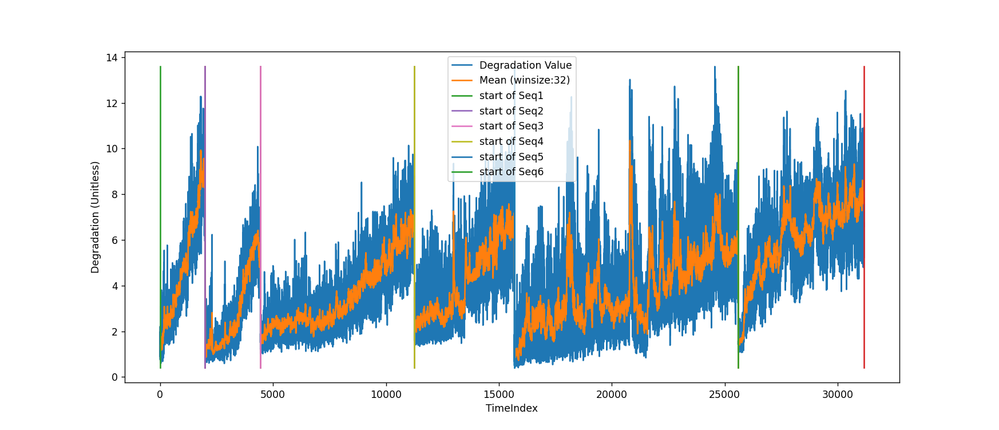

In [36]:
%matplotlib notebook
plt.plot(all_seq_y_tilde_vect, label='Degradation Value')
plt.plot(pd.Series(all_seq_y_tilde_vect).rolling(18).mean(), label='Mean (winsize:32)')

min_y = all_seq_y_tilde_vect.min()
max_y = all_seq_y_tilde_vect.max()


'''
seq_period_iloc = [
    [    10,  2000],
    #[ 2001,  2265],
    [ 2001,  4723],
    [ 4751, 11579],
    [11585, 16018],
    [16042, 25962],
    [25962, 31000],
]
'''
seq_period_iloc = [
    [    0,  1991],
    [ 1991,  4440],
    [ 4440, 11259],
    [11259, 15683],
    #[15683, 20914],
    #[20914, 25594],
    [15683, 25594],
    [25594, 31170],
]

seq_index = 1
for stime_iloc, etime_iloc in seq_period_iloc:
    plt.plot([stime_iloc, stime_iloc], [min_y, max_y], label = "start of Seq{}".format(seq_index))
    plt.plot([etime_iloc, etime_iloc], [min_y, max_y])
    seq_index += 1


plt.ylabel("Degradation (Unitless)")
plt.xlabel("TimeIndex")

plt.legend()
#plt.figure(figsize = (20,20))
plt.show()

In [37]:
import plotly.graph_objects as go

fig = go.Figure()

plot_raw_pts = True
    
fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=all_seq_y_tilde_vect,
        mode='lines',
        name = 'Degradation Metric',
        #mode='lines+markers',
    )
)

fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
        mode='lines',
        name = 'Mean(Windowsize:32)',
        #mode='lines+markers',
    )
)

In [38]:
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
# Create traces
trace0 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=all_seq_y_tilde_vect,
            mode='lines',
            name = 'Degradation Metric',
            #mode='lines+markers',
            )

trace1 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
            mode='lines',
            name = 'Mean(Windowsize:32)',
            #mode='lines+markers',
            )

# Fill out data with our traces
data = [trace0, trace1]
# Plot it and save as basic-line.html
pyo.iplot(data, filename = 'basic-line')

## To see the intmediate feature

In [ ]:
feature_output1 = model.feature_extractor.featuremap1.transpose(1,0).cpu()
feature_output2 = model.feature_extractor.featuremap2.transpose(1,0).cpu()
feature_output3 = model.feature_extractor.featuremapfc.transpose(1,0).cpu()
#feature_output4 = model.model.featuremap4.transpose(1,0).cpu()
#feature_output_fc = model.model.featuremapfc.transpose(1,0).cpu()
feature_output3.shape

In [39]:
def feature_imshow(inp, title=None):
    
    """Imshow for Tensor."""
    
    inp = inp.detach().numpy().transpose((2, 1, 0))
    
    mean = np.array([0.5, 0.5, 0.5])
    
    std = np.array([0.5, 0.5, 0.5])
    
    inp = std * inp + mean
    
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(5,5))
    plt.imshow(inp)
    
    if title is not None:
        plt.title(title)
    
    plt.pause(0.001)  # pause a bit so that plots are updated

In [43]:
dl = test_dataloaders[4]
refs = refs_list[4]

curr_refs = refs.float().to(device)
num_data = len(dl)
print(num_data)
    
loss_vect = np.zeros(num_data)
var_res_vect= np.zeros(num_data)

y_vect = np.zeros(num_data)
y_tilde_vect = np.zeros(num_data)

dl_iter = iter(dl)

for i in tqdm(range(5122)):
    try:
        img,label = next(dl_iter)

    except (StopIteration, TypeError):
        dl_iter = iter(curr_train_dl)
        img,label = next(dl_iter)

    y_vect[i] = label

    img = img.float().to(device)
    
    #feature_output3 = model.feature_extractor.featuremapfc.transpose(1,0).cpu()
    
    latent_vector = model.featuremap(img)
    refs_latent_vectors = model.featuremap_refs(curr_refs)
    
    output1 = latent_vector.transpose(1,0).cpu()
    output_refs = refs_latent_vectors.transpose(1,0).cpu()

9911


<IPython.core.display.Javascript object>


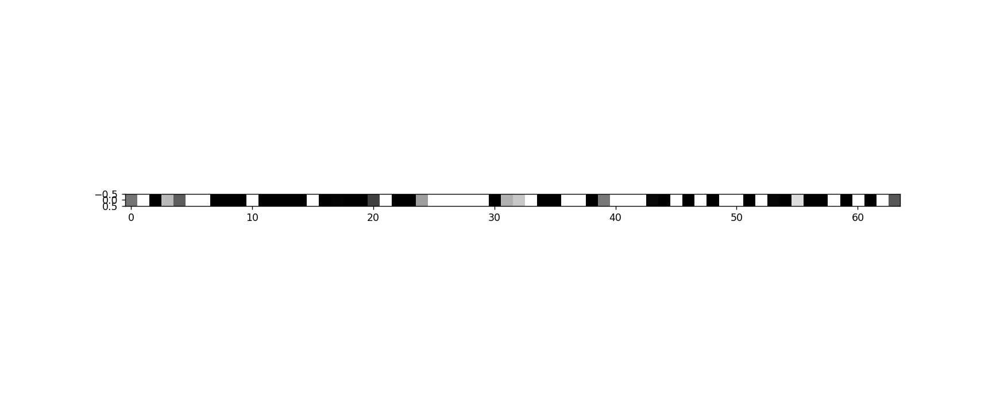

In [44]:
out = torchvision.utils.make_grid(output1)
feature_imshow(out)

<IPython.core.display.Javascript object>


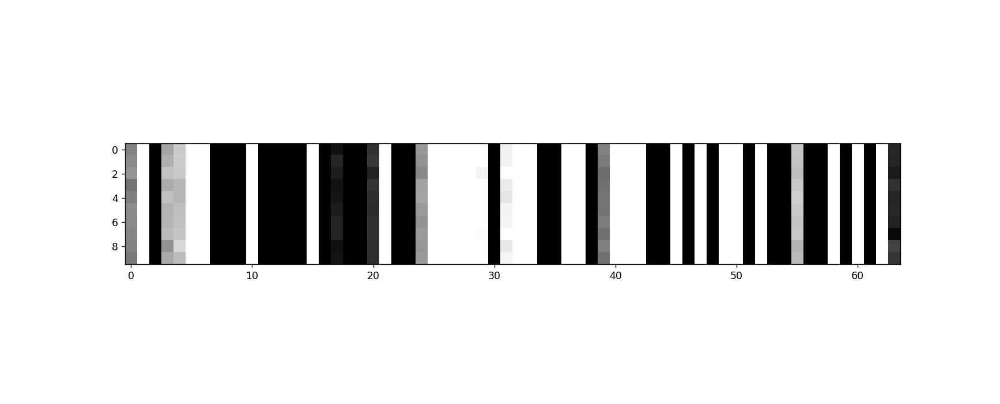

In [45]:
out = torchvision.utils.make_grid(output_refs)
feature_imshow(out)